In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/unfreeze-v2-cifar/unfreeze_v2_xception_cifar10.h5
/kaggle/input/base3-bn-do-aug/my_cifar10_base3_augmentation_dropout_bn.h5


# Cifar10: 1ere partie
# Détection d'objets: 2ème partie

In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

In [7]:
tf.__version__

'2.1.0'

In [8]:
keras.__version__

'2.2.4-tf'

In [9]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.cifar10.load_data()

# Pixel intensitie
X_train_full = X_train_full / 255.0
X_test = X_test / 255.0

X_train = X_train_full[5000:] 
y_train = y_train_full[5000:]
X_valid = X_train_full[:5000] 
y_valid = y_train_full[:5000]

170500096/170498071 [==============================] - 11s 0us/step


In [10]:
X_train_full.shape

(50000, 32, 32, 3)

In [11]:
y_valid[0]

array([6], dtype=uint8)

# Pixel scaling

In [12]:
pixel_means = X_train.mean(axis=0, keepdims=True)
pixel_stds = X_train.std(axis=0, keepdims=True) +1e-7
X_train_scaled = (X_train - pixel_means) / pixel_stds
X_valid_scaled = (X_valid - pixel_means) / pixel_stds
X_test_scaled = (X_test - pixel_means) / pixel_stds



In [13]:
y_train[0]

array([6], dtype=uint8)

# Baseline model

On reprend l'architecture VGG pour notre modele de base, puis on rajoutera des blocks de convolution.

Base1: 1 block conv 

early_stopping:24, Overfitting after the fifth epoch. (val_loss increasing when loss decreasing) **epoch 5:** acc: 0.77, val_acc: 0.69, acc_test: 0.68

**----------------------------------------**

Base2: 2 blocks conv

early_stopping:27, Overfitting after the seventh epoch. **epoch 7:** acc: 0.83 val_acc: 0.735, acc_test: 0.726 


**----------------------------------------**

On observe que le modele avec deux blocks est plus performant que le premier.

Base3: 3 blocks conv

early_stopping:27, Overfitting after the seventh epoch. **epoch 7:** acc: 0.81, val_acc: 0.75, acc_test: 0.74 

Conclusion: Plus le modele devient profond, plus il devient performant. (tester si cette tendance s'applique avec plus de blocks)
Les 3 modeles overfit à partir d'un certain nombre d'epochs.

Comment améliorer les performances du modeles:

- Dropout
- BatchNormalization
- Alternate learning rates, adaptative learning rates, learning rate schedule
- Data Augmentation
- Transfer Learning (voir partie 2)

In [16]:
model = keras.models.Sequential([
    keras.layers.Conv2D(64, 3, padding="same",input_shape=[32, 32, 3]),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Conv2D(64, 3, padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(128, 3, padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Conv2D(128, 3, padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Dropout(0.3),
    
    keras.layers.Conv2D(256, 3, padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Conv2D(256, 3, padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Dropout(0.4),

    keras.layers.Flatten(),
    keras.layers.Dense(128),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation="softmax")
])
early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("my_cifar10_base3_augmentation_dropout_bn.h5", save_best_only=True)
#run_index = 4 # increment every time you train the model
#run_logdir = os.path.join(os.curdir, "my_cifar10_logs", "run_bn_{:03d}".format(run_index))
#tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
callbacks = [early_stopping_cb, model_checkpoint_cb]
optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9)
optimizer1=keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)
model.compile(optimizer=optimizer1, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
batch_normalization (BatchNo (None, 32, 32, 64)        256       
_________________________________________________________________
activation (Activation)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 64)        36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
activation_1 (Activation)    (None, 32, 32, 64)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 64)        0

# Dropout
patience = 10

Fixed Dropout (0.2): 

acc: 0.88 - val_acc: 0.825 - acc_test: 0.82

Fixed Dropout(0.2, 0.5 fully connected layer): 

acc: 0.93 - val_acc: 0.85 - acc_test: 0.84

Increasing dropout (0.2 to 0.5):

acc: 0.8961 - val_acc: 0.8592 - acc_test: 0.843


# Data Augmentation
Dropout + Data Augmentation
 acc: 0.8224 - val_acc: 0.8646 - acc_test: 0.852

In [17]:
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import np_utils

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    )
# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
datagen.fit(X_train_scaled)

Using TensorFlow backend.


# Batch Normalization
Dropout + DA + BN : acc: 0.9177 - val_acc: 0.9168 - acc_test: 0.9046

# Training model

In [19]:
# train with image augmentation
history_aug=model.fit_generator(datagen.flow(X_train_scaled, y_train, batch_size=32),
                    steps_per_epoch= len(X_train_scaled) / 32, epochs=100, validation_data=(X_valid_scaled, y_valid), callbacks = [early_stopping_cb, model_checkpoint_cb])

Train for 1406.25 steps, validate on 5000 samples
Epoch 1/100
1407/1406 [==============================] - 31s 22ms/step - loss: 1.5622 - accuracy: 0.4457 - val_loss: 1.6822 - val_accuracy: 0.4724
Epoch 2/100
1407/1406 [==============================] - 29s 20ms/step - loss: 1.1195 - accuracy: 0.6060 - val_loss: 0.9825 - val_accuracy: 0.6472
Epoch 3/100
1407/1406 [==============================] - 30s 21ms/step - loss: 0.9808 - accuracy: 0.6609 - val_loss: 0.8600 - val_accuracy: 0.7050
Epoch 4/100
1407/1406 [==============================] - 29s 21ms/step - loss: 0.8901 - accuracy: 0.6938 - val_loss: 0.8410 - val_accuracy: 0.7148
Epoch 5/100
1407/1406 [==============================] - 30s 21ms/step - loss: 0.8160 - accuracy: 0.7212 - val_loss: 0.6588 - val_accuracy: 0.7724
Epoch 6/100
1407/1406 [==============================] - 29s 20ms/step - loss: 0.7611 - accuracy: 0.7423 - val_loss: 0.6303 - val_accuracy: 0.7820
Epoch 7/100
1407/1406 [==============================] - 30s 21ms/st

1407/1406 [==============================] - 30s 21ms/step - loss: 0.2639 - accuracy: 0.9094 - val_loss: 0.3107 - val_accuracy: 0.9068
Epoch 57/100
1407/1406 [==============================] - 29s 21ms/step - loss: 0.2569 - accuracy: 0.9133 - val_loss: 0.2882 - val_accuracy: 0.9160
Epoch 58/100
1407/1406 [==============================] - 30s 21ms/step - loss: 0.2542 - accuracy: 0.9120 - val_loss: 0.3384 - val_accuracy: 0.8994
Epoch 59/100
1407/1406 [==============================] - 29s 20ms/step - loss: 0.2556 - accuracy: 0.9127 - val_loss: 0.2998 - val_accuracy: 0.9080
Epoch 60/100
1407/1406 [==============================] - 30s 21ms/step - loss: 0.2499 - accuracy: 0.9139 - val_loss: 0.3045 - val_accuracy: 0.9102
Epoch 61/100
1407/1406 [==============================] - 29s 21ms/step - loss: 0.2498 - accuracy: 0.9136 - val_loss: 0.3154 - val_accuracy: 0.9046
Epoch 62/100
1407/1406 [==============================] - 30s 21ms/step - loss: 0.2468 - accuracy: 0.9157 - val_loss: 0.2970 

# Load model

In [14]:
model = keras.models.load_model('/kaggle/input/base3-bn-do-aug/my_cifar10_base3_augmentation_dropout_bn.h5')

In [20]:
model.evaluate(X_test_scaled, y_test)

10000/10000 [==============================] - 1s 145us/sample - loss: 0.3003 - accuracy: 0.9048


[0.30030633702278137, 0.9048]

In [21]:
from matplotlib import pyplot
# plot diagnostic learning curves
def summarize_diagnostics(history):
    # plot loss
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Classification Accuracy')
    pyplot.plot(history.history['accuracy'], color='blue', label='train')
    pyplot.plot(history.history['val_accuracy'], color='orange', label='test')

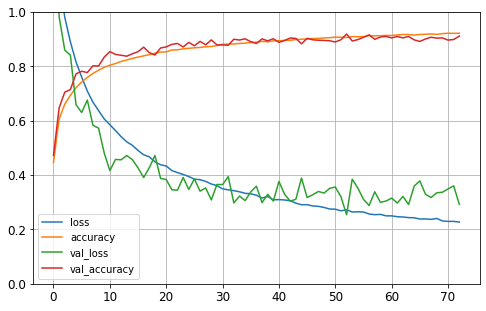

In [22]:
pd.DataFrame(history_aug.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

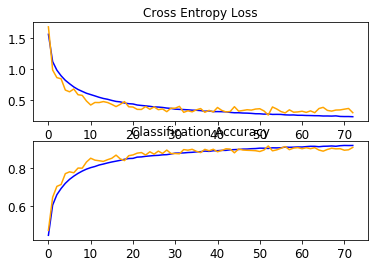

In [23]:
summarize_diagnostics(history_aug)

In [ ]:
#%load_ext tensorboard
#%tensorboard --logdir=./my_cifar10_logs --port=6006

## Transfer Learning: Using Pretrained models from Keras (Ne pas lancer les cellules en dessous, lancer directement à partir de pip install tensorflow_datasets)

In [10]:
pip install tensorflow_datasets 

  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=21499 sha256=53879b993e73fc4e0436e2e6501c8d336ef8fee5d475596d9a914e281eb8e5a8
  Stored in directory: c:\users\bastos\appdata\local\pip\cache\wheels\59\9a\1d\3f1afbbb5122d0410547bf9eb50955f4a7a98e53a6d8b99bd1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78597 sha256=f6677264b32cc9f6b63ded81d6ece6cccb120b85979dace92167e55f963b4ad7
  Stored in directory: c:\users\bastos\appdata\local\pip\cache\wheels\09\84\74\d2b4feb9ac9488bc83c475cb2cbe8e8b7d9cea8320d32f3787
  Created wheel for googleapis-common-protos: filename=googleapis_common_protos-1.51.0-py3-none-any.whl size=77602 sha256=51f549b68edf1ae2af0f0735d8f9abf391f3e630980d207c3fc738e34322669c
  Stored in directory: c:\users\bastos\appdata\local\pip\cache\wheels\35\8d\af\a922cb18800b31fadac3523cadf6c1efdf233b788fe7a4da70
Successfully built promise dill googleapis-common-protos
Note: you may need to restart the kernel to use updated packages.


In [25]:
class_names=["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

In [11]:
import tensorflow_datasets as tfds

dataset, info = tfds.load("cifar10", as_supervised=True, with_info=True)
dataset_size = info.splits["train"].num_examples # 3670
class_names = info.features["label"].names # ["airplane", "automobile", ...]
n_classes = info.features["label"].num_classes # 9

C:\Users\BastOS\Anaconda3\envs\deeplearningaz\lib\site-packages\urllib3\connectionpool.py:1004: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.cs.toronto.edu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


Shuffling and writing examples to C:\Users\BastOS\tensorflow_datasets\cifar10\3.0.2.incomplete59GZUZ\cifar10-train.tfrecord


Shuffling and writing examples to C:\Users\BastOS\tensorflow_datasets\cifar10\3.0.2.incomplete59GZUZ\cifar10-test.tfrecord


Dataset cifar10 downloaded and prepared to C:\Users\BastOS\tensorflow_datasets\cifar10\3.0.2. Subsequent calls will reuse this data.


In [12]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "cifar10",
    split=["train[:10%]", "train[10%:25%]", "train[25%:]"],
    as_supervised=True)



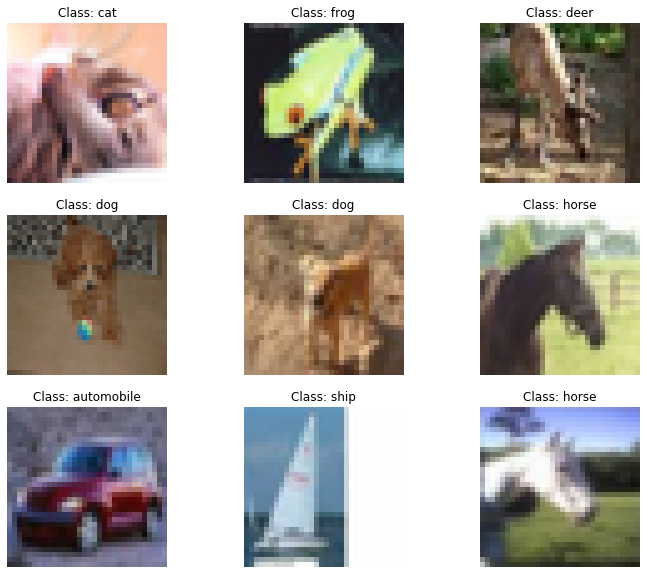

In [28]:
plt.figure(figsize=(12, 10))
index = 0
for image, label in train_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title("Class: {}".format(class_names[label]))
    plt.axis("off")

plt.show()

In [25]:
# Data augmentation
from functools import partial

def central_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]])
    top_crop = (shape[0] - min_dim) // 4
    bottom_crop = shape[0] - top_crop
    left_crop = (shape[1] - min_dim) // 4
    right_crop = shape[1] - left_crop
    return image[top_crop:bottom_crop, left_crop:right_crop]

def random_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]]) * 90 // 100
    return tf.image.random_crop(image, [min_dim, min_dim, 3])

def preprocess(image, label, randomize=False):
    if randomize:
        cropped_image = random_crop(image)
        cropped_image = tf.image.random_flip_left_right(cropped_image)
    else:
        cropped_image = central_crop(image)
    resized_image = tf.image.resize(cropped_image, [299, 299])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

batch_size = 32
train_set = train_set_raw.shuffle(1000).repeat()
train_set = train_set.map(partial(preprocess, randomize=True)).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(preprocess).batch(batch_size).prefetch(1)
test_set = test_set_raw.map(preprocess).batch(batch_size).prefetch(1)

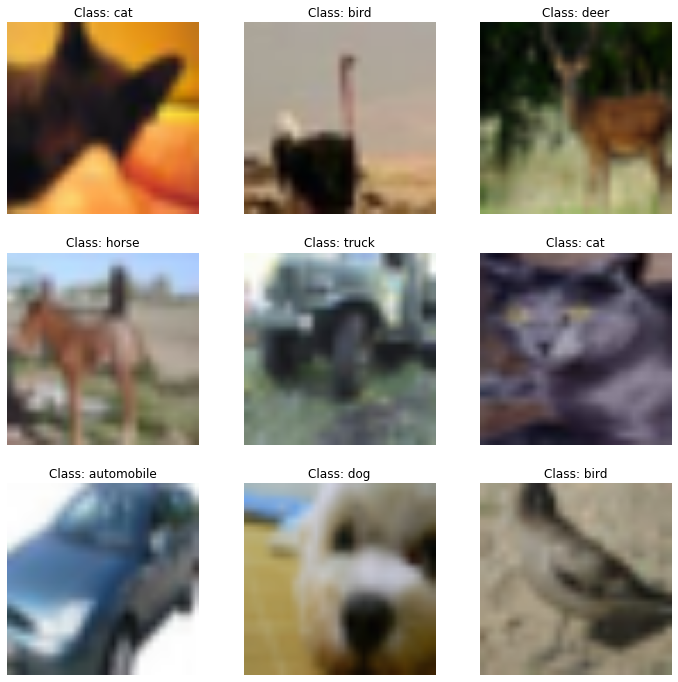

In [30]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in train_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

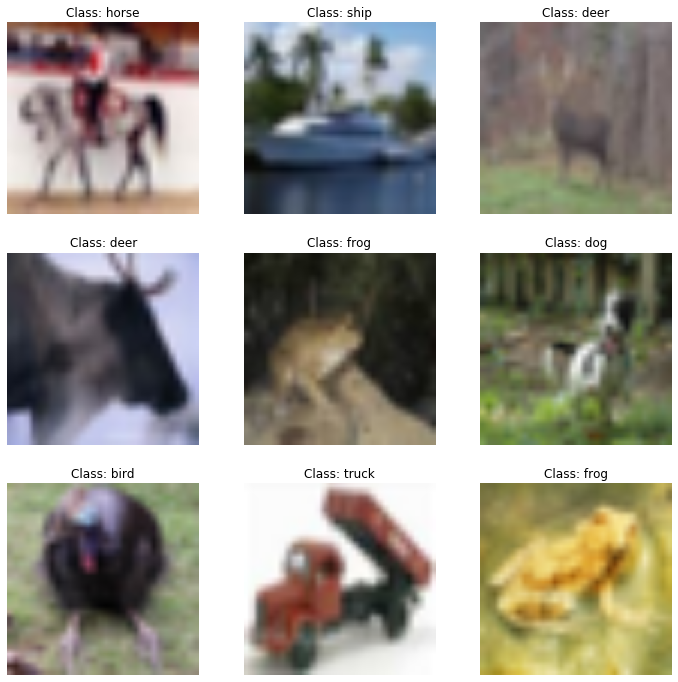

In [31]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

In [32]:
base_model_xception = keras.applications.xception.Xception(weights="imagenet", include_top=False, input_shape=[299, 299, 3])

83689472/83683744 [==============================] - 7s 0us/step


In [33]:
base_model_xception.summary()

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [34]:
avg = keras.layers.GlobalAveragePooling2D()(base_model_xception.output)
output = keras.layers.Dense(10, activation="softmax")(avg)
model_xception = keras.models.Model(inputs=base_model_xception.input, outputs=output)

In [35]:
for layer in base_model_xception.layers:
    layer.trainable = False

In [36]:
#early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("freeze_xception_cifar10.h5", save_best_only=True)
optimizer = keras.optimizers.SGD(lr=0.2, momentum=0.9, decay=0.01)
model_xception.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

history = model_xception.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5,
                    callbacks=[model_checkpoint_cb])

Train for 1171 steps, validate for 234 steps
Epoch 1/5
1171/1171 [==============================] - 201s 172ms/step - loss: 0.8848 - accuracy: 0.7159 - val_loss: 0.9127 - val_accuracy: 0.7447
Epoch 2/5
1171/1171 [==============================] - 197s 168ms/step - loss: 0.6805 - accuracy: 0.7673 - val_loss: 0.8655 - val_accuracy: 0.7501
Epoch 3/5
1171/1171 [==============================] - 197s 169ms/step - loss: 0.6564 - accuracy: 0.7729 - val_loss: 0.8587 - val_accuracy: 0.7493
Epoch 4/5
1171/1171 [==============================] - 197s 168ms/step - loss: 0.6440 - accuracy: 0.7802 - val_loss: 0.8386 - val_accuracy: 0.7536
Epoch 5/5
1171/1171 [==============================] - 197s 168ms/step - loss: 0.6367 - accuracy: 0.7796 - val_loss: 0.8528 - val_accuracy: 0.7523


In [37]:
model_xception.evaluate(test_set)

    157/Unknown - 21s 135ms/step - loss: 0.8567 - accuracy: 0.7474

[0.8566881651711312, 0.7474]

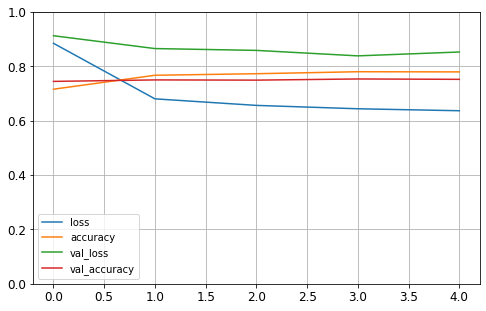

In [38]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

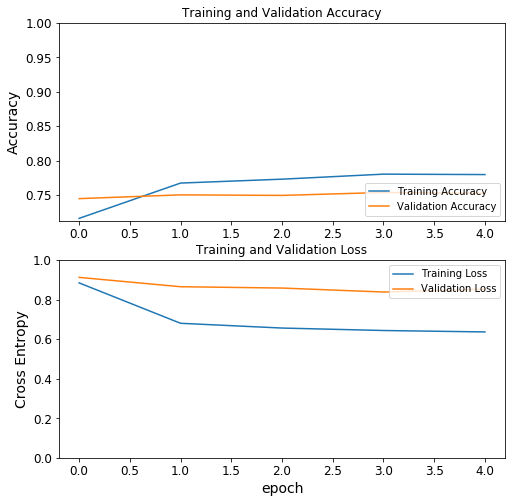

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# Layers unfreeze v1.

In [ ]:
#model_xception = keras.models.load_model('/kaggle/input/freeze/freeze_xception_cifar10(1).h5')

In [ ]:
base_model_xception.summary()

In [41]:
for index, layer in enumerate(base_model_xception.layers):
    print(index, layer.name)

0 input_1
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d_6
13 block2_pool
14 batch_normalization_7
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_7
23 block3_pool
24 batch_normalization_8
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_8
33 block4_pool
34 batch_normalization_9
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_sepconv3

Apres avoir entrainé le modele sur quelques epochs, on obtient de bons résultats sur le jeu de validation ainsi que le jeu de test (94% d'acc). Ce qui veut dire que les top layers sont plutot bien réglés, on est donc pret à unfreeze les toutes les couches ou, d'unfreeze les dernieres couches de base_model_xception (ce qui est plus recommandé). 
Etant donné que ce sont des blocks de convolution on unfreeze les deux derniers blocs.

On recupere l'indice du block 13.
Cette fois ci on utilise un lr beaucoup plus petit pour éviter le "damaging" sur les couches pré-entrainées.

In [42]:
fine_tune = 116
for layer in base_model_xception.layers[fine_tune:]:
    layer.trainable = True

In [43]:
#early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("unfreeze_v1_xception_cifar10.h5", save_best_only=True)
optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, decay=0.001)
model_xception.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

history = model_xception.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=10,
                    callbacks=[model_checkpoint_cb])

Train for 1171 steps, validate for 234 steps
Epoch 1/10
1171/1171 [==============================] - 232s 198ms/step - loss: 0.4870 - accuracy: 0.8336 - val_loss: 0.6544 - val_accuracy: 0.7874
Epoch 2/10
1171/1171 [==============================] - 229s 195ms/step - loss: 0.3244 - accuracy: 0.8873 - val_loss: 0.6369 - val_accuracy: 0.8025
Epoch 3/10
1171/1171 [==============================] - 228s 195ms/step - loss: 0.2663 - accuracy: 0.9092 - val_loss: 0.5930 - val_accuracy: 0.8142
Epoch 4/10
1171/1171 [==============================] - 228s 195ms/step - loss: 0.2325 - accuracy: 0.9189 - val_loss: 0.6184 - val_accuracy: 0.8113
Epoch 5/10
1171/1171 [==============================] - 228s 194ms/step - loss: 0.2098 - accuracy: 0.9262 - val_loss: 0.5951 - val_accuracy: 0.8184
Epoch 6/10
1171/1171 [==============================] - 228s 194ms/step - loss: 0.1950 - accuracy: 0.9331 - val_loss: 0.5954 - val_accuracy: 0.8189
Epoch 7/10
1171/1171 [==============================] - 228s 195ms/

In [44]:
model_xception.evaluate(test_set)

    157/Unknown - 21s 134ms/step - loss: 0.5642 - accuracy: 0.8322

[0.5642313970027456, 0.8322]

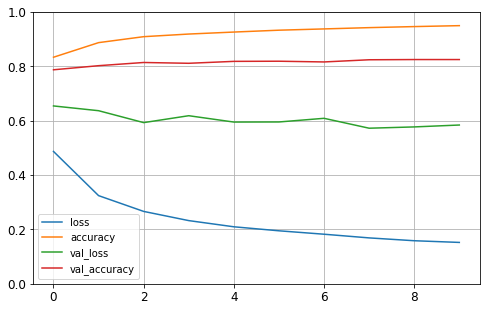

In [45]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

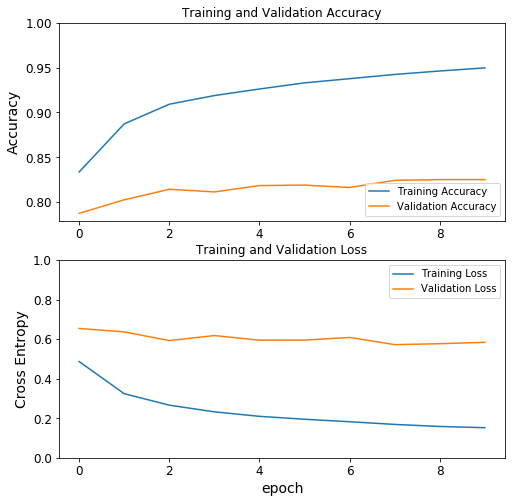

In [46]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
#model_xception = keras.models.load_model('unfreeze_v1_xception_cifar10.h5')

 # Layers unfreeze v2.

Que se passe t-il si nous autorisons le modele à mettre à jour tous les poids de toutes les couches........

In [47]:
for layer in base_model_xception.layers:
    layer.trainable = True

In [ ]:
#early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("unfreeze_v2_xception_cifar10.h5", save_best_only=True)
optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, decay=0.001)
model_xception.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

history = model_xception.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=10,
                    callbacks=[model_checkpoint_cb])

Train for 1171 steps, validate for 234 steps
Epoch 1/10
1171/1171 [==============================] - 840s 717ms/step - loss: 0.2019 - accuracy: 0.9302 - val_loss: 0.1332 - val_accuracy: 0.9563
Epoch 2/10
1171/1171 [==============================] - 835s 713ms/step - loss: 0.0692 - accuracy: 0.9761 - val_loss: 0.1103 - val_accuracy: 0.9631
Epoch 3/10
1171/1171 [==============================] - 835s 713ms/step - loss: 0.0361 - accuracy: 0.9885 - val_loss: 0.1005 - val_accuracy: 0.9674
Epoch 4/10
1171/1171 [==============================] - 835s 713ms/step - loss: 0.0223 - accuracy: 0.9934 - val_loss: 0.0982 - val_accuracy: 0.9698
Epoch 5/10
1171/1171 [==============================] - 835s 713ms/step - loss: 0.0167 - accuracy: 0.9952 - val_loss: 0.0930 - val_accuracy: 0.9714
Epoch 6/10
1171/1171 [==============================] - 835s 713ms/step - loss: 0.0138 - accuracy: 0.9960 - val_loss: 0.0929 - val_accuracy: 0.9722
Epoch 7/10
1171/1171 [==============================] - 835s 713ms/

In [ ]:
model_xception.evaluate(test_set)

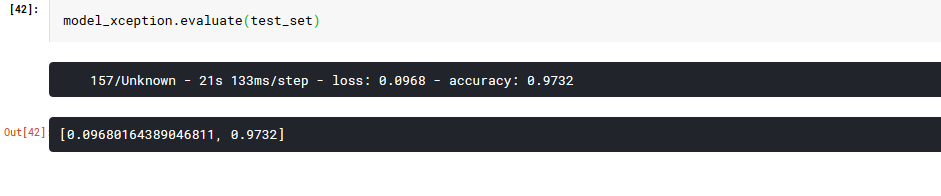

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

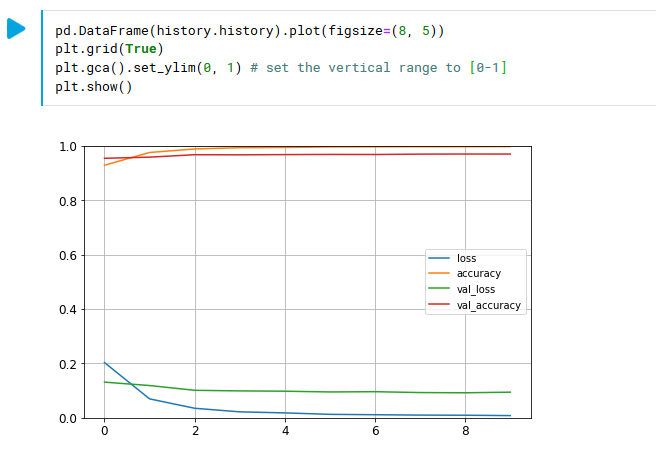

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

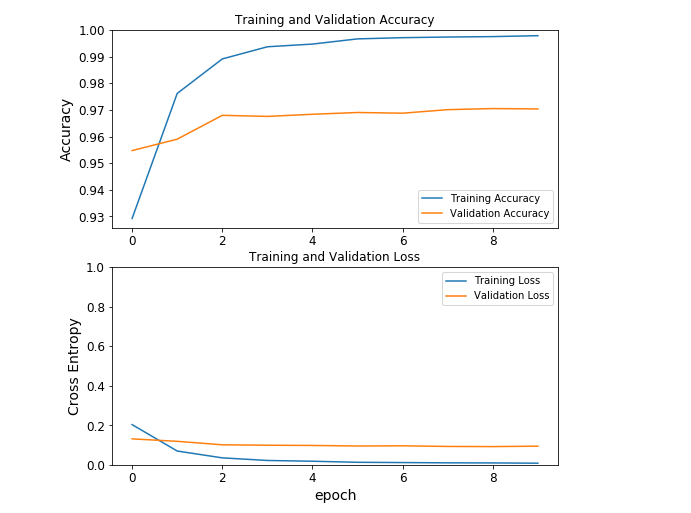

Au fur à mesure que l'on autorise le modele à mettre à jour les poids des couches, l'accuracy s'améliore. 

Notre modele va donc s'adapter à notre dataset et va se spécialiser dans la détection de features propres à celui-ci. 

Le problème c'est que l'on perd en généralisation (ce que nous offrait le modele de base avec les couches gelées).

# ---------------------------------------

# Rajout dans l'output :  Pas de changement significatif

In [ ]:
base_model_xception = keras.applications.xception.Xception(weights="imagenet", include_top=False, input_shape=[299, 299, 3])
avg = keras.layers.GlobalAveragePooling2D()(base_model_xception.output)
x = keras.layers.BatchNormalization()(avg)
x = keras.layers.Dense(128, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(64, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(10, activation="softmax")(x)
model = keras.models.Model(inputs=base_model_xception.input, outputs=output)

In [ ]:
model.summary()

In [ ]:
#early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("opti_xception_cifar10.h5", save_best_only=True)
optimizer = keras.optimizers.SGD(lr=0.2, momentum=0.9, decay=0.01)
model_xception.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

history = model_xception.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5,
                    callbacks=[model_checkpoint_cb])

In [ ]:
model_xception.evaluate(test_set)

In [ ]:
fine_tune = 116
for layer in base_model_xception.layers[fine_tune:]:
    layer.trainable = True

In [ ]:
#early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("opti_unfreeze_xception_cifar10.h5", save_best_only=True)
optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, decay=0.001)
model_xception.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

history = model_xception.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=10,
                    callbacks=[model_checkpoint_cb])

In [ ]:
base_model = keras.applications.vgg16.VGG16(weights="imagenet", include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
output = keras.layers.Dense(10, activation="softmax")(avg)
model = keras.models.Model(inputs=base_model.input, outputs=output)

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

optimizer = keras.optimizers.SGD(lr=0.2, momentum=0.9, decay=0.01)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5)

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

..

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# ---------------------------------------

# Visualisation des filtres et features

In [2]:
model = keras.models.load_model("C:/Users/BastOS/Desktop/tp_image_deeplearningynov/cnn_bastien/models/unfreeze_v2_xception_cifar10.h5")

In [3]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

In [4]:
for layer in model.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv1_bn
block1_conv1_act
block1_conv2
block1_conv2_bn
block1_conv2_act
block2_sepconv1
block2_sepconv1_bn
block2_sepconv2_act
block2_sepconv2
block2_sepconv2_bn
conv2d
block2_pool
batch_normalization
add
block3_sepconv1_act
block3_sepconv1
block3_sepconv1_bn
block3_sepconv2_act
block3_sepconv2
block3_sepconv2_bn
conv2d_1
block3_pool
batch_normalization_1
add_1
block4_sepconv1_act
block4_sepconv1
block4_sepconv1_bn
block4_sepconv2_act
block4_sepconv2
block4_sepconv2_bn
conv2d_2
block4_pool
batch_normalization_2
add_2
block5_sepconv1_act
block5_sepconv1
block5_sepconv1_bn
block5_sepconv2_act
block5_sepconv2
block5_sepconv2_bn
block5_sepconv3_act
block5_sepconv3
block5_sepconv3_bn
add_3
block6_sepconv1_act
block6_sepconv1
block6_sepconv1_bn
block6_sepconv2_act
block6_sepconv2
block6_sepconv2_bn
block6_sepconv3_act
block6_sepconv3
block6_sepconv3_bn
add_4
block7_sepconv1_act
block7_sepconv1
block7_sepconv1_bn
block7_sepconv2_act
block7_sepconv2
block7_sepconv2_

In [5]:
# summarize filters in each convolutional layer

# summarize filter shapes
for layer in model.layers:
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # get filter weights
    weights = model.layers[1].get_weights()[0]
    print(layer.name, weights.shape)

block1_conv1 (3, 3, 3, 32)
block1_conv1_bn (3, 3, 3, 32)
block1_conv1_act (3, 3, 3, 32)
block1_conv2 (3, 3, 3, 32)
block1_conv2_bn (3, 3, 3, 32)
block1_conv2_act (3, 3, 3, 32)
block2_sepconv1 (3, 3, 3, 32)
block2_sepconv1_bn (3, 3, 3, 32)
block2_sepconv2_act (3, 3, 3, 32)
block2_sepconv2 (3, 3, 3, 32)
block2_sepconv2_bn (3, 3, 3, 32)
conv2d (3, 3, 3, 32)
block3_sepconv1_act (3, 3, 3, 32)
block3_sepconv1 (3, 3, 3, 32)
block3_sepconv1_bn (3, 3, 3, 32)
block3_sepconv2_act (3, 3, 3, 32)
block3_sepconv2 (3, 3, 3, 32)
block3_sepconv2_bn (3, 3, 3, 32)
conv2d_1 (3, 3, 3, 32)
block4_sepconv1_act (3, 3, 3, 32)
block4_sepconv1 (3, 3, 3, 32)
block4_sepconv1_bn (3, 3, 3, 32)
block4_sepconv2_act (3, 3, 3, 32)
block4_sepconv2 (3, 3, 3, 32)
block4_sepconv2_bn (3, 3, 3, 32)
conv2d_2 (3, 3, 3, 32)
block5_sepconv1_act (3, 3, 3, 32)
block5_sepconv1 (3, 3, 3, 32)
block5_sepconv1_bn (3, 3, 3, 32)
block5_sepconv2_act (3, 3, 3, 32)
block5_sepconv2 (3, 3, 3, 32)
block5_sepconv2_bn (3, 3, 3, 32)
block5_sepconv3

# On peut voir que toutes les couches de convolutions utilisent un filtre 3x3, ce qui reste petit et peut être facile à interpreter.

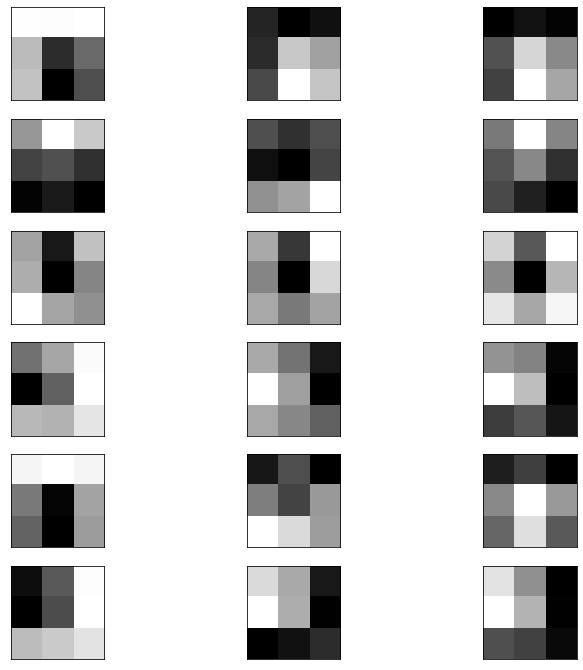

In [6]:
# retrieve weights from the second hidden layer
filters = model.layers[1].get_weights()[0]
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)
# plot first few filters
n_filters, ix = 6, 1
plt.figure(figsize=(12, 12))
for i in range(n_filters):
    # get the filter
    f = filters[:, :, :, i]
    # plot each channel separately
    for j in range(3):
        # specify subplot and turn of axis
        ax = plt.subplot(n_filters, 3, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
# show the figure

plt.show()

Determine sur la zone locale sur laquelle la couche de convolution va se concentrer.

In [7]:
# summarize feature map shapes
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # summarize output shape
    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 149, 149, 32)
2 block1_conv1_bn (None, 149, 149, 32)
3 block1_conv1_act (None, 149, 149, 32)
4 block1_conv2 (None, 147, 147, 64)
5 block1_conv2_bn (None, 147, 147, 64)
6 block1_conv2_act (None, 147, 147, 64)
7 block2_sepconv1 (None, 147, 147, 128)
8 block2_sepconv1_bn (None, 147, 147, 128)
9 block2_sepconv2_act (None, 147, 147, 128)
10 block2_sepconv2 (None, 147, 147, 128)
11 block2_sepconv2_bn (None, 147, 147, 128)
12 conv2d (None, 74, 74, 128)
16 block3_sepconv1_act (None, 74, 74, 128)
17 block3_sepconv1 (None, 74, 74, 256)
18 block3_sepconv1_bn (None, 74, 74, 256)
19 block3_sepconv2_act (None, 74, 74, 256)
20 block3_sepconv2 (None, 74, 74, 256)
21 block3_sepconv2_bn (None, 74, 74, 256)
22 conv2d_1 (None, 37, 37, 256)
26 block4_sepconv1_act (None, 37, 37, 256)
27 block4_sepconv1 (None, 37, 37, 728)
28 block4_sepconv1_bn (None, 37, 37, 728)
29 block4_sepconv2_act (None, 37, 37, 728)
30 block4_sepconv2 (None, 37, 37, 728)
31 block4_sepconv2_bn (None, 37, 37, 728)


# Visualize features maps
1. Selection d'une image dans test: Visualisation layer 1
2. Visualisation layers plus profond
3. Test avec une image mal classée

In [8]:
class_names=["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

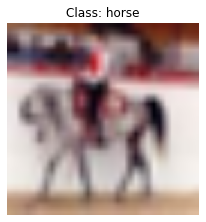

In [14]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(1):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

In [15]:
for X_batch, y_batch in test_set.take(1):
    simple_pred = model.predict(tf.expand_dims(X_batch[0], 0))
    print("Prediction classe: ", np.argmax(simple_pred, 1), "Classe réelle: ", y_batch[0], " ------> ", class_names[y_batch[0]])


Prediction classe:  [7] Classe réelle:  tf.Tensor(7, shape=(), dtype=int64)  ------>  horse


In [16]:
# redefine model to output right after the first hidden layer
model_viz_conv1 = keras.models.Model(inputs=model.inputs, outputs=model.layers[1].output)

In [17]:
model_viz_conv1.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 299, 299, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 149, 149, 32)      864       
Total params: 864
Trainable params: 864
Non-trainable params: 0
_________________________________________________________________


In [18]:
for X_batch, y_batch in test_set.take(1):
    feature_maps = model_viz_conv1.predict(tf.expand_dims(X_batch[0], 0))

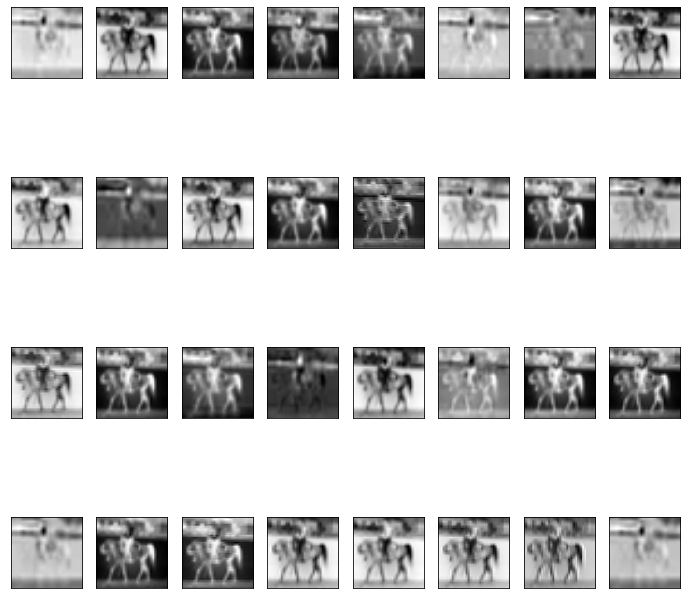

In [19]:
row = 4
col = 8
ix = 1
plt.figure(figsize=(12, 12))
for _ in range(row):
    for _ in range(col):
        # specify subplot and turn of axis
        ax = plt.subplot(row, col, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
# show the figure

plt.show()

Le résultat des filtres de la premiere couche appliqués sur l'image de test, avec différentes caractéristiques misent en avant.

In [20]:
for index, layer in enumerate(model.layers):
    print(index, layer.name)

0 input_1
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d
13 block2_pool
14 batch_normalization
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_1
23 block3_pool
24 batch_normalization_1
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_2
33 block4_pool
34 batch_normalization_2
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_sepconv3_act

In [21]:
# redefine model to output right after the first hidden layer
ixs = [6,11,21,31,44,54,64,74,84,94,104,114,121,131]
outputs = [model.layers[i].output for i in ixs]
model_viz_multiple_conv = keras.models.Model(inputs=model.inputs, outputs=outputs)
model_viz_multiple_conv.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [22]:
for X_batch, y_batch in test_set.take(1):
    feature_maps = model_viz_multiple_conv.predict(tf.expand_dims(X_batch[0], 0))

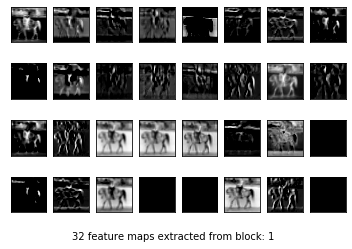

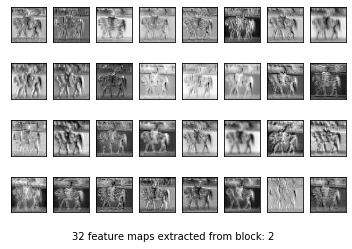

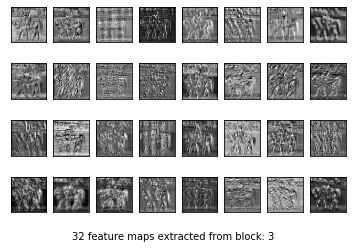

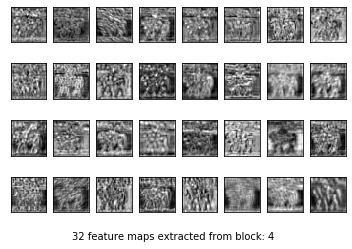

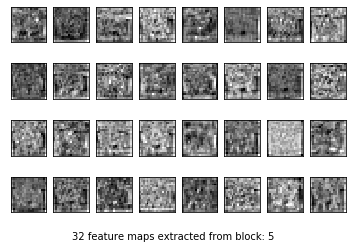

...

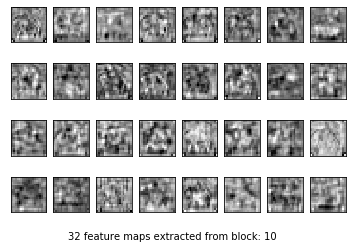

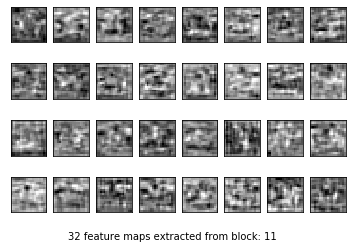

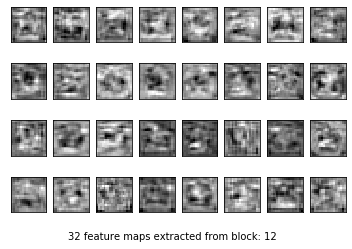

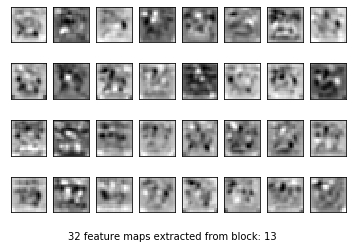

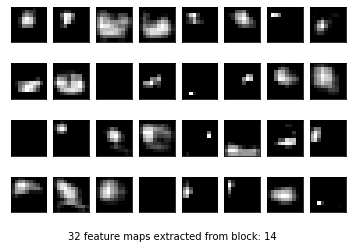

In [23]:
row = 4
col = 8
i_conv = 1
for fmap in feature_maps:
    fig = plt.figure()
    fig.text(.5, .05, "32 feature maps extracted from block: {}".format(i_conv), ha='center')

    i_conv += 1
    ix = 1
    for _ in range(row):
        for _ in range(col):
            # specify subplot and turn of axis
            ax = plt.subplot(row, col, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    plt.show()

Plus on monte dans les couches de convolutions, plus les détails de l'image disparaissent.
En effet le modele va extraire des motifs, des concepts beaucoup plus généraux, qui lui permettront de faire une classification.
Nous perdons la faculté de détecter ces caracteristiques plus profondes.

# Image mal classifiée

In [26]:
pred = model.predict(test_set.take(1))
    

In [27]:
class_names=["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

In [28]:
for X_batch, y_batch in test_set.take(1):
    print(y_batch)

tf.Tensor([7 8 4 4 6 5 2 9 6 6 9 9 3 0 8 7 9 0 4 9 0 8 6 4 2 8 8 7 0 8 4 2], shape=(32,), dtype=int64)


In [29]:
print(np.argmax(pred,1))

[7 8 4 4 6 5 2 9 6 6 9 9 3 0 8 7 9 0 4 0 0 8 6 4 2 8 8 7 0 8 4 2]


Sur ce batch le modele a pris un avion (0) pour un camion (9), ce qui est interessant c'est qu'il y a plusieurs 9 et 0 dans ce tenseur, et il ne s'est trompé qu'une seule fois.

Observons l'image en question.


# Photo A

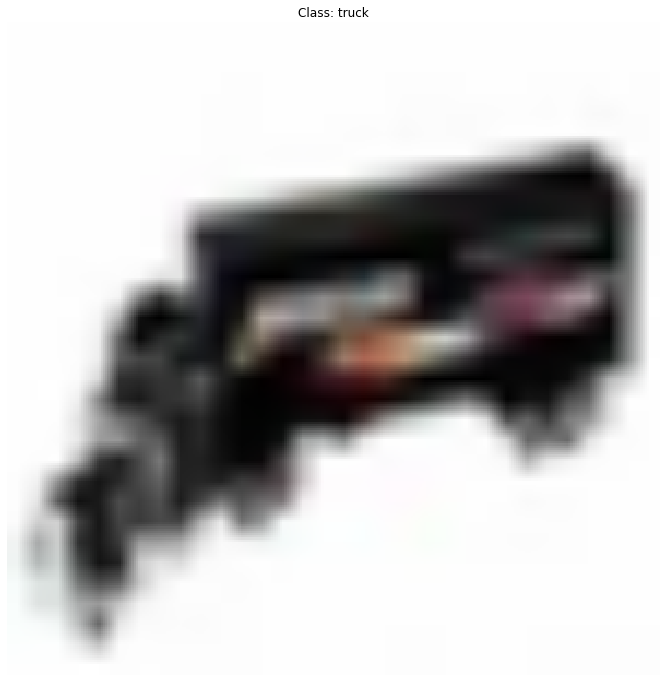

In [30]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    plt.subplot(1, 1, 1)
    plt.imshow(X_batch[19] / 2 + 0.5)
    plt.title("Class: {}".format(class_names[y_batch[19]]))
    plt.axis("off")

plt.show()

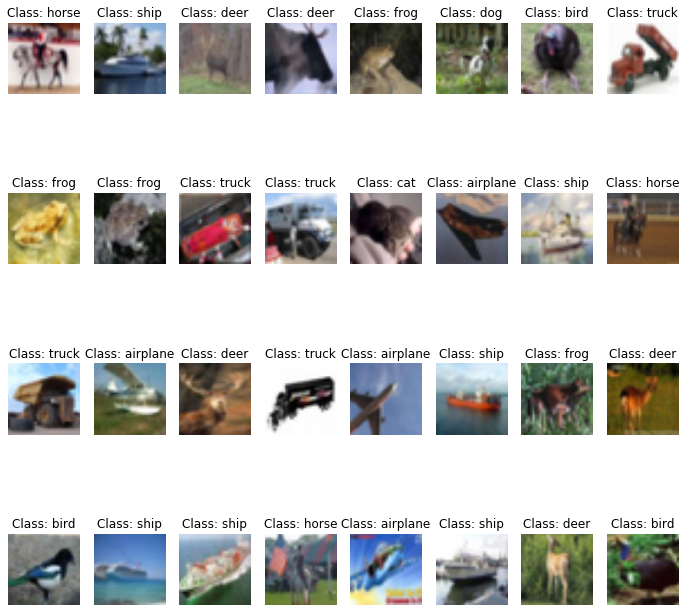

In [31]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(32):
        plt.subplot(4, 8, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

# Photo B

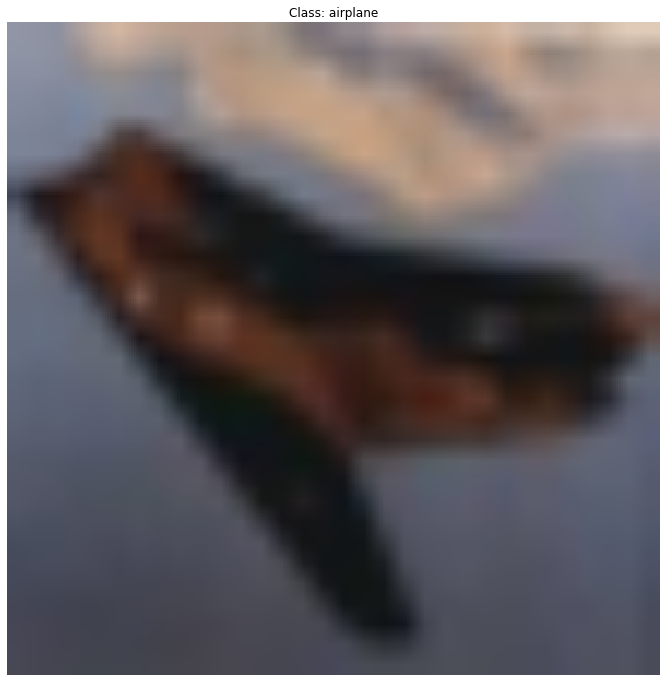

In [32]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    plt.subplot(1, 1, 1)
    plt.imshow(X_batch[13] / 2 + 0.5)
    plt.title("Class: {}".format(class_names[y_batch[13]]))
    plt.axis("off")

plt.show()

In [33]:
for X_batch, y_batch in test_set.take(1):
    print(y_batch[19])
    feature_maps = model_viz_multiple_conv.predict(tf.expand_dims(X_batch[19], 0))

tf.Tensor(9, shape=(), dtype=int64)


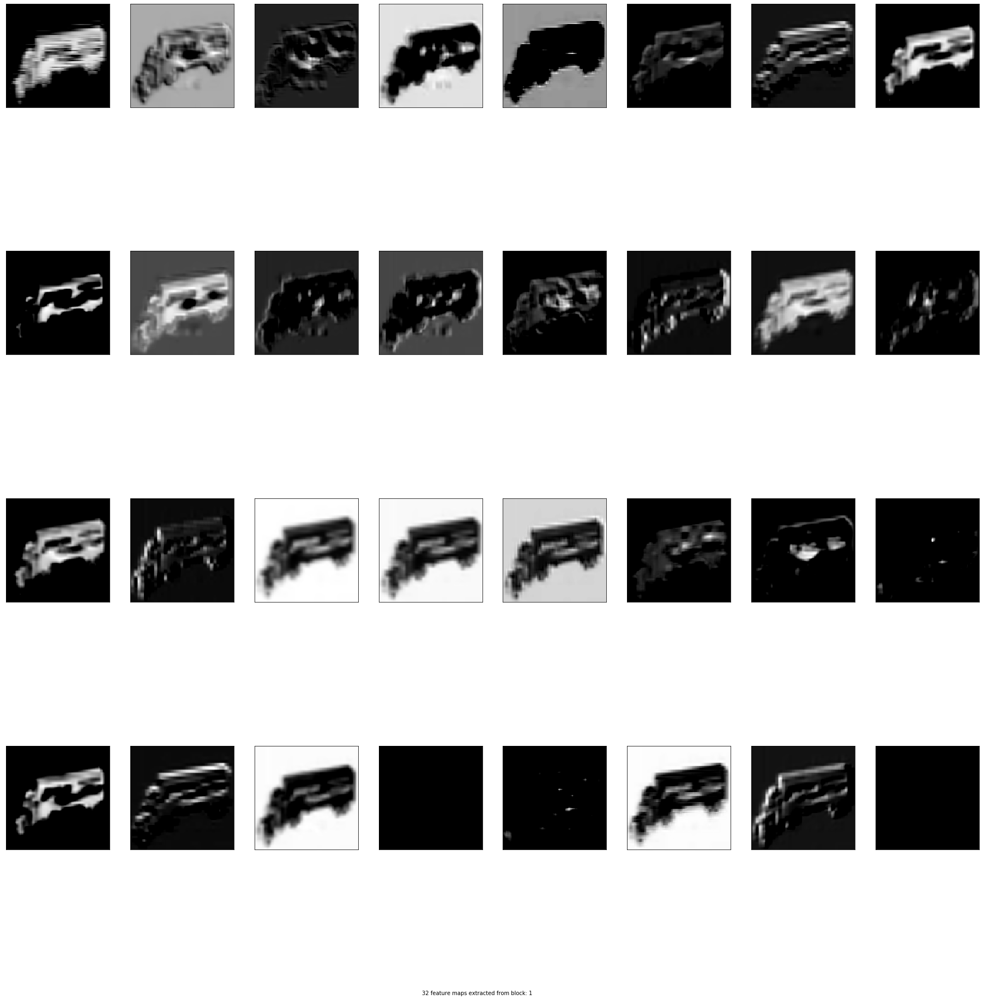

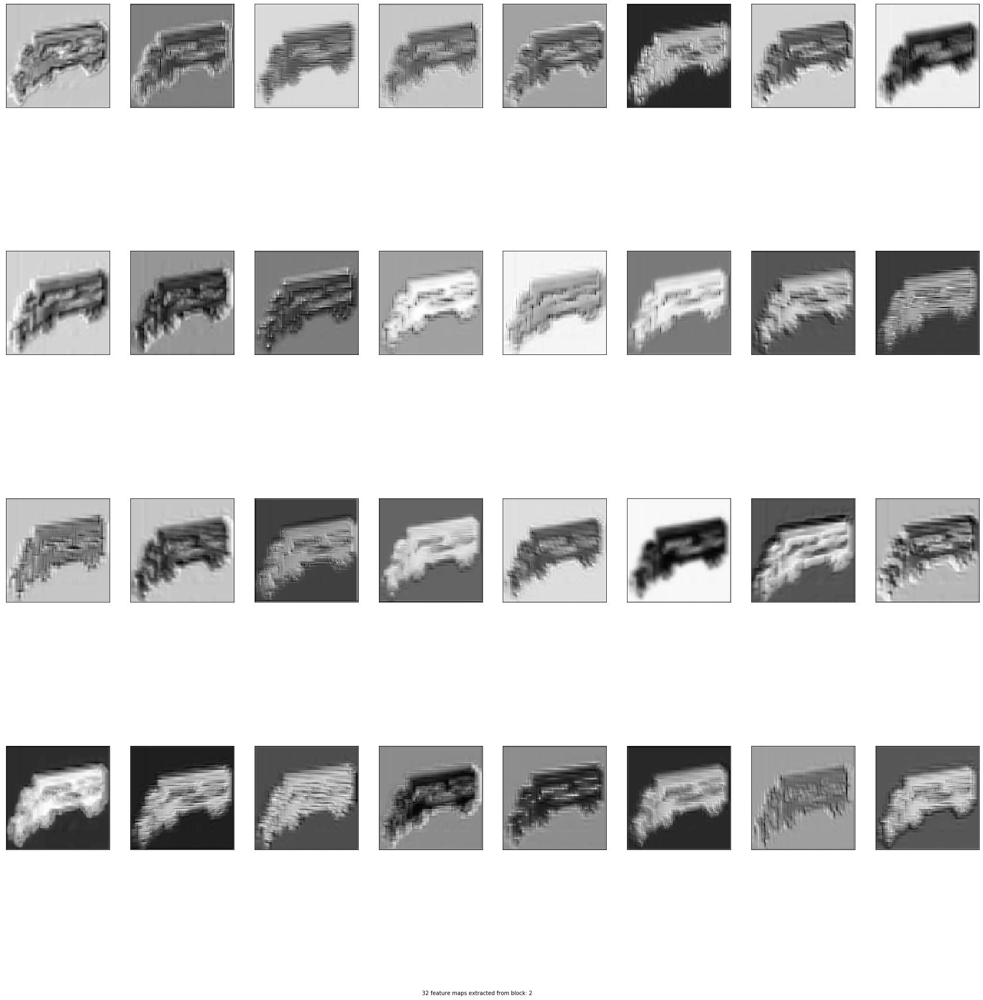

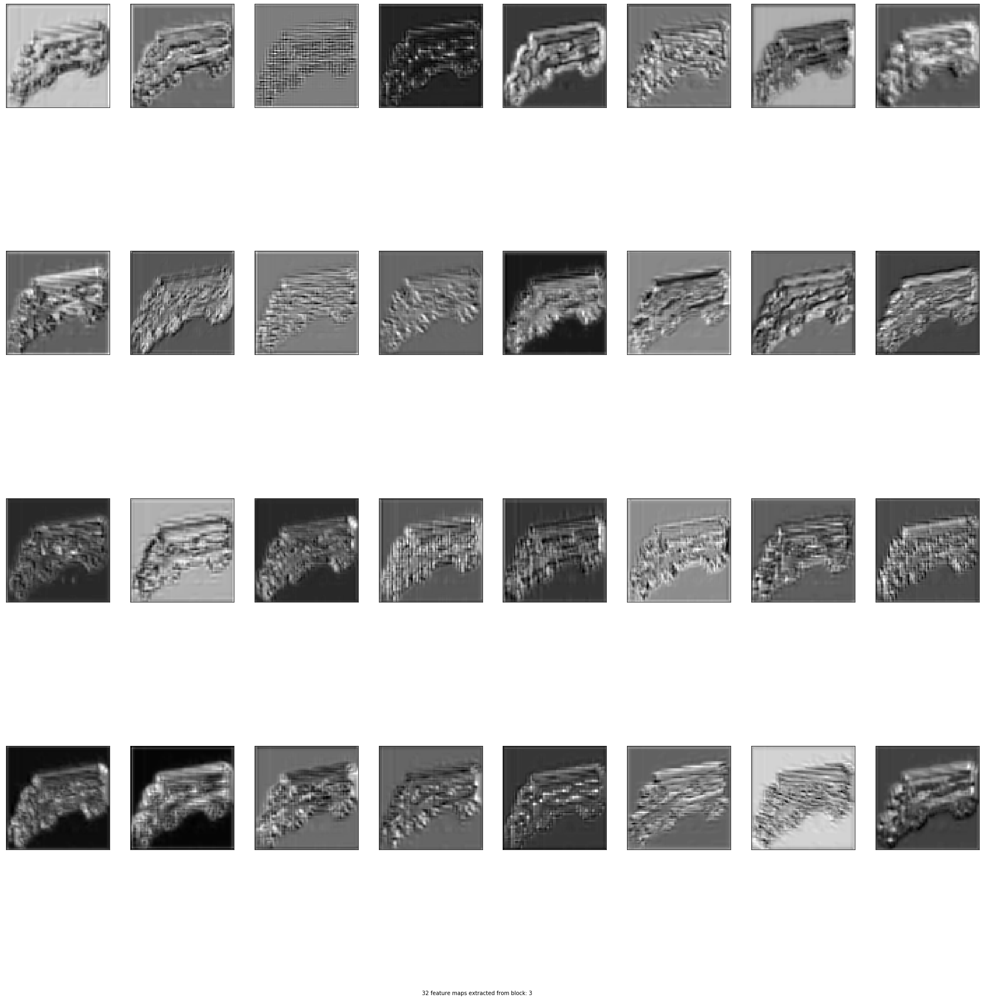

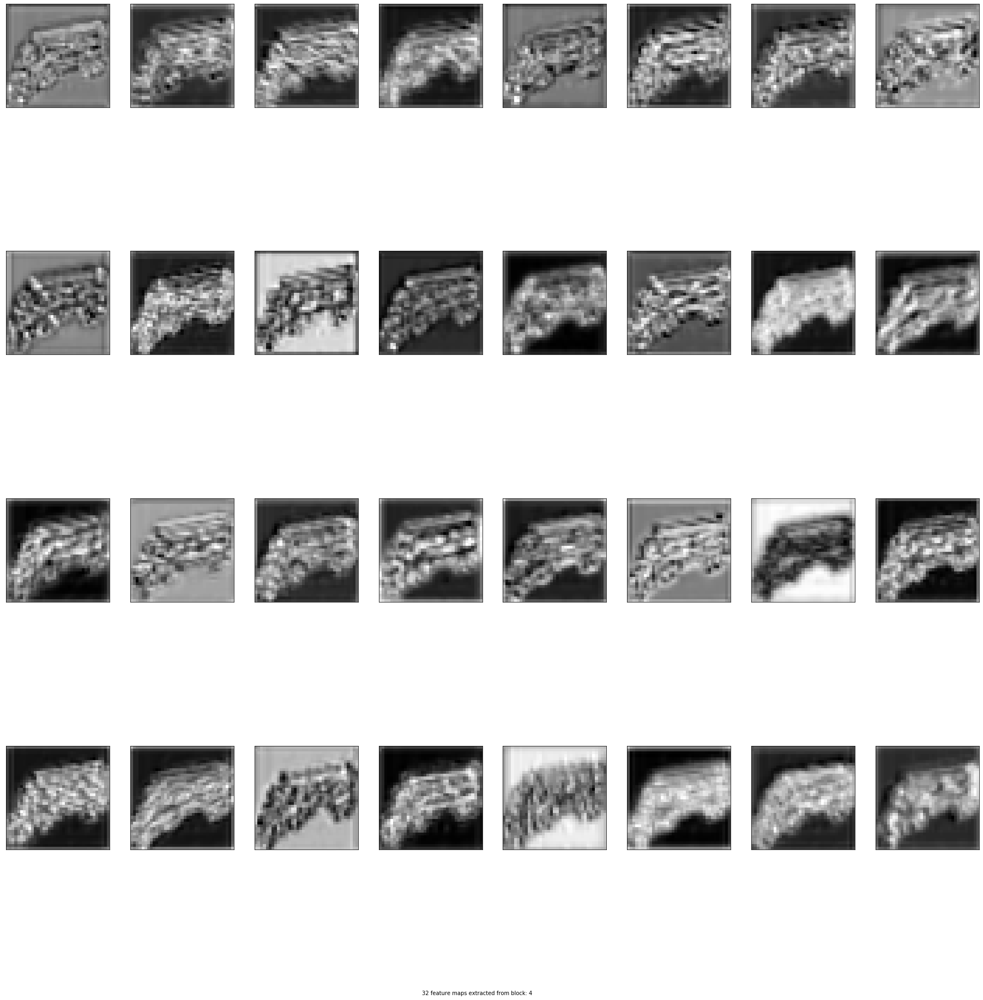

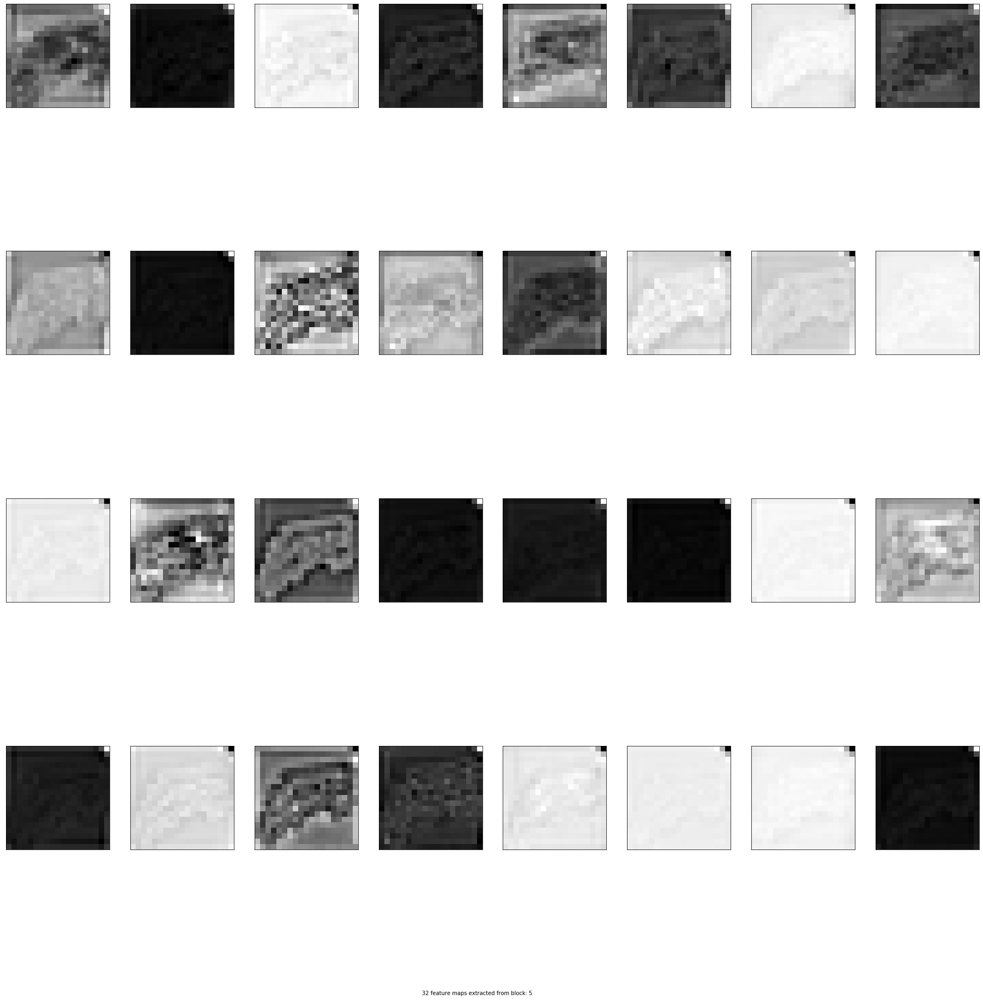

...

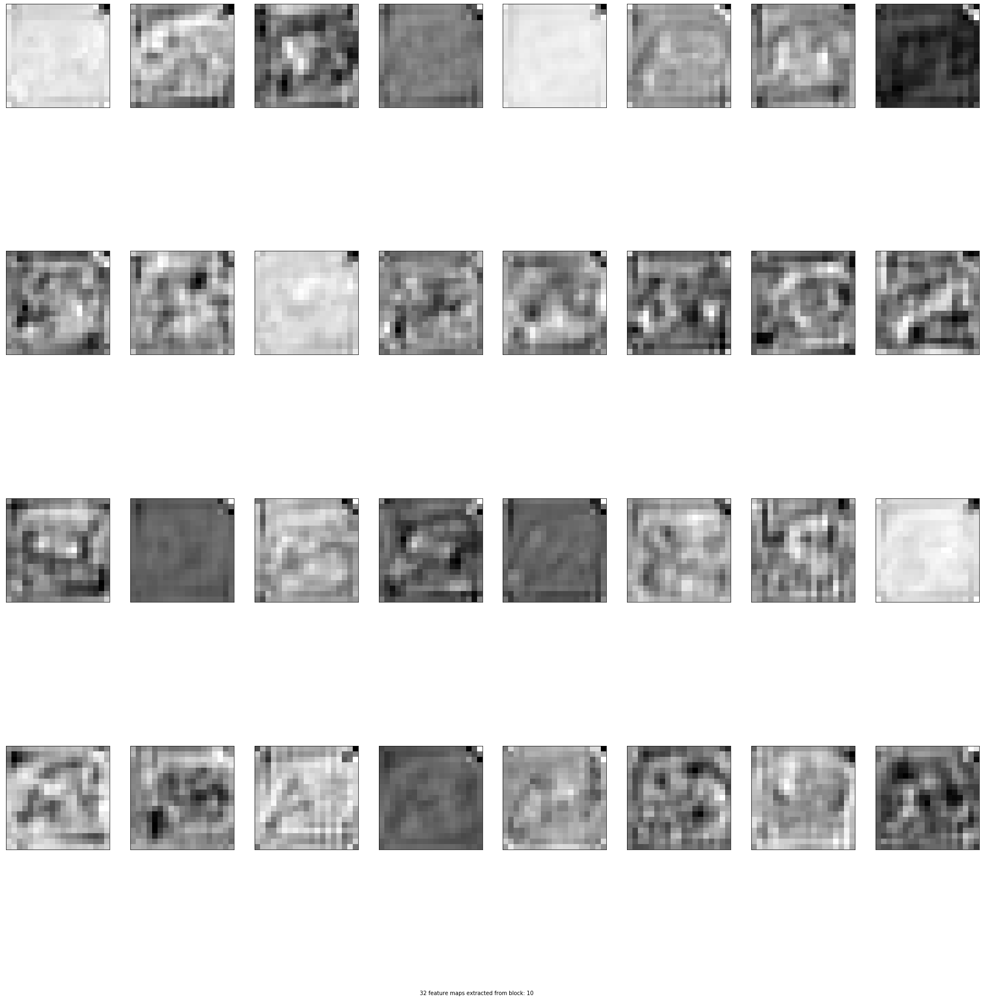

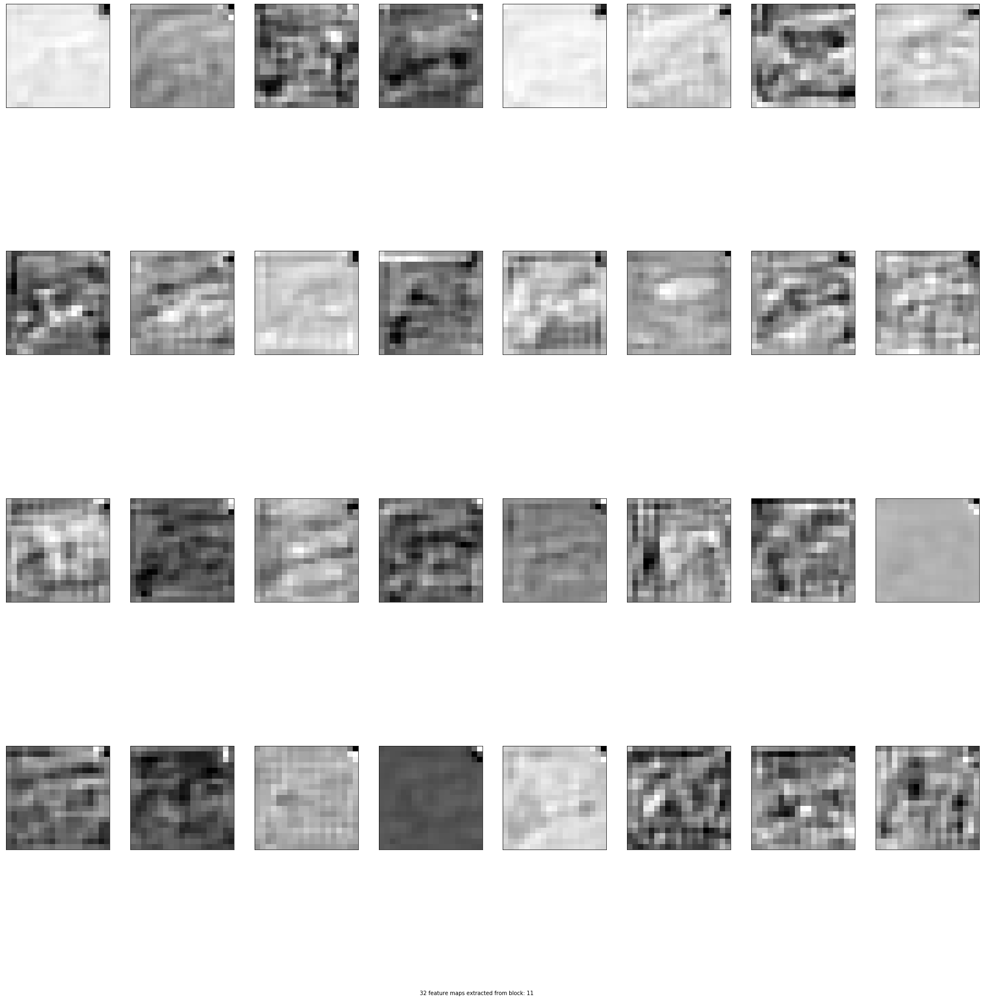

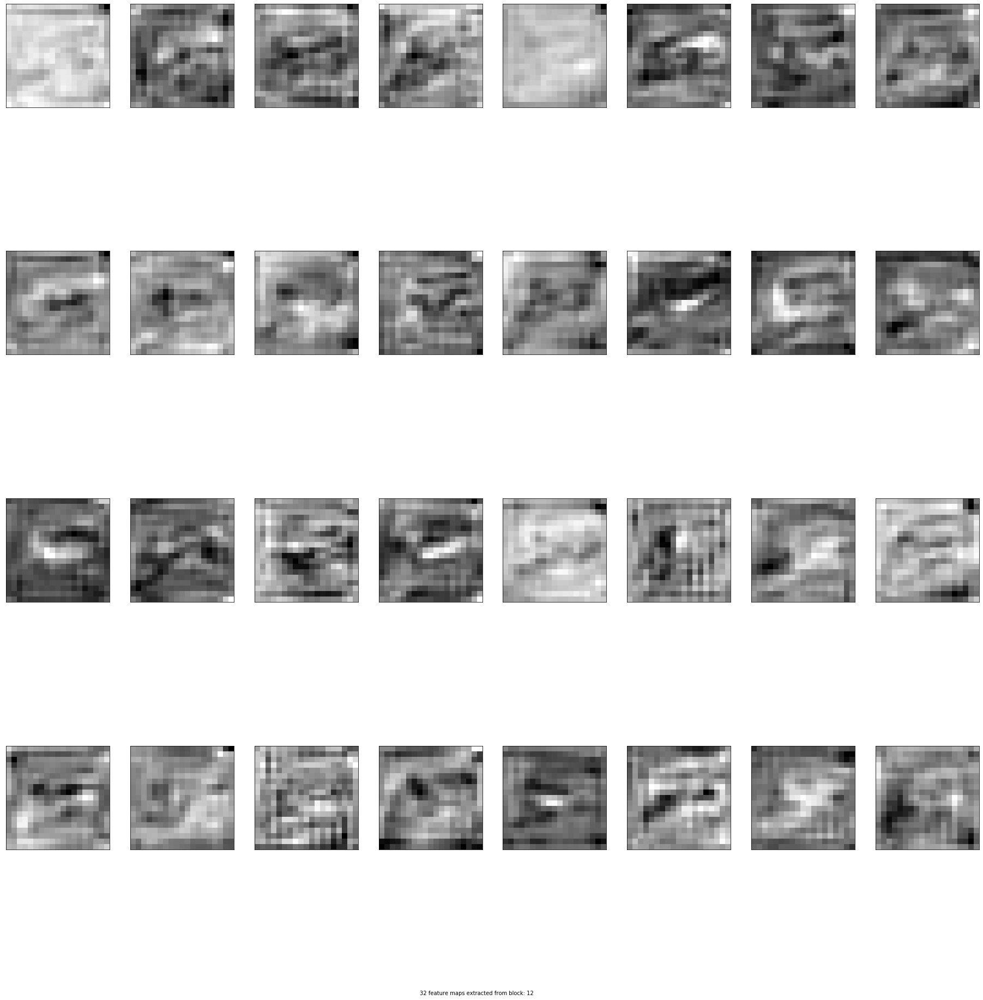

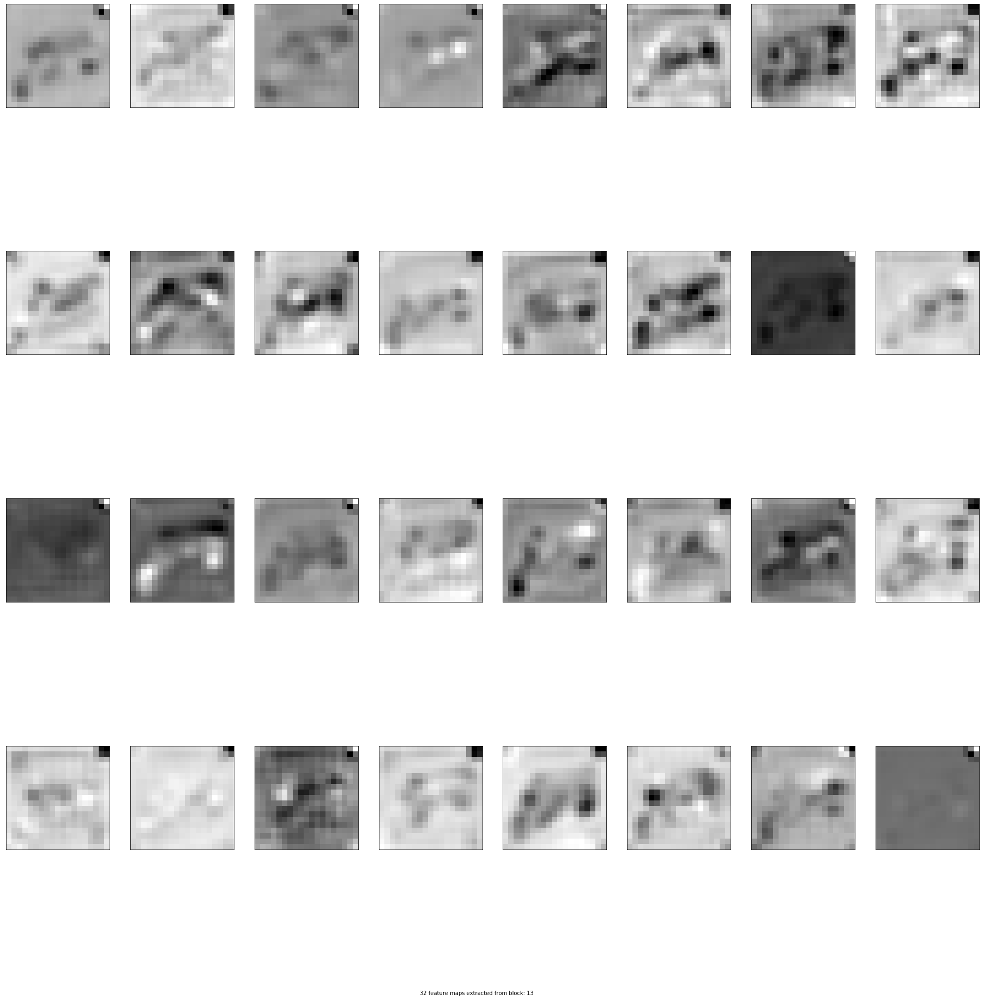

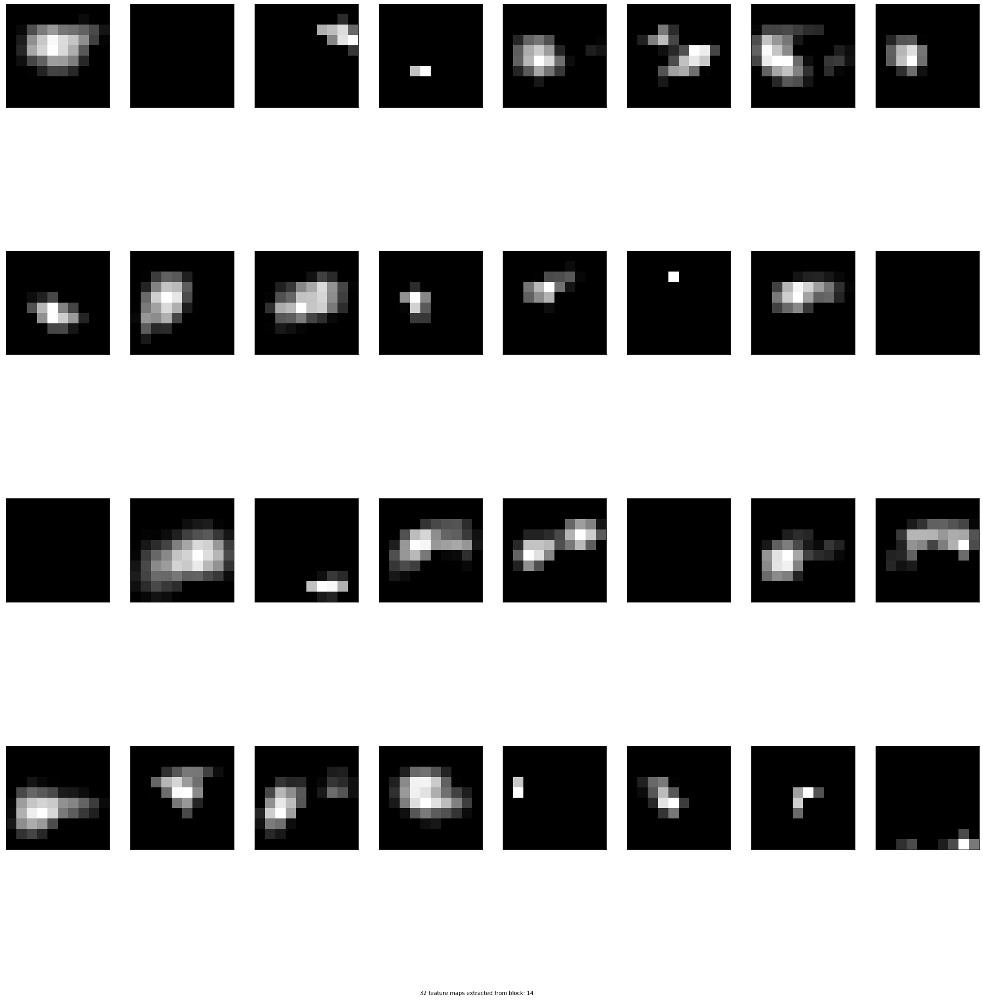

In [34]:
row = 4
col = 8
i_conv = 1
for fmap in feature_maps:
    fig = plt.figure(figsize=(32,32))
    fig.text(.5, .05, "32 feature maps extracted from block: {}".format(i_conv), ha='center')

    i_conv += 1
    ix = 1
    for _ in range(row):
        for _ in range(col):
            # specify subplot and turn of axis
            ax = plt.subplot(row, col, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    plt.show()

(5000,)
(5000,)


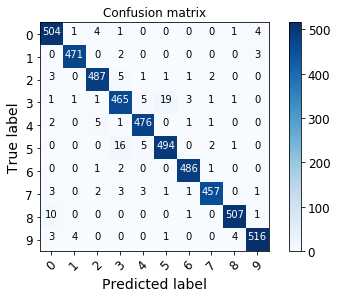

In [35]:
from sklearn.metrics import confusion_matrix
import itertools
# Look at confusion matrix 

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the test dataset
Y_pred = model.predict(test_set)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
print(Y_pred_classes.shape)


Y_true = []
for X_b, y_b in test_set:
    for x in y_b:
        Y_true.append(x.numpy())
Y_true = np.array(Y_true)
# compute the confusion matrix
print(Y_true.shape)
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(10)) 

# 19 FP et 16 FN concernant la classe 5: dog en relation avec la classe 3: chat
Sans surprise, il est évident que ces deux classes soient la plus grande cause d'erreurs du modele.
Dans les erreurs (voir plus bas), on retrouve principalement des chiens de petites tailles donc facilement confondable avec des chats.

# Autre remarque interessante il s'est trompé 10 fois en classifiant un bateau comme étant un avion, mais beaucoup moins dans l'autre sens (1 fois)
La couleur bleue joue un rôle préponderant dans ces deux classes d'images, ce qui en est peut etre la cause des erreurs, ainsi que le profil long et affiné, la silhouette, d'un bateau et d'un avion peuvent se ressembler.

De plus l'image de base étant du 32x32, nous l'avons beaucoup agrandi 299x299, ce qui peut perturber le modele à distinguer deux classes proches (notamment chien et chat)



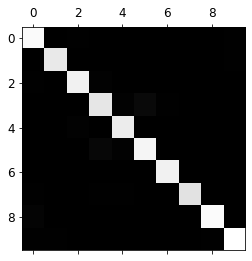

In [36]:
plt.matshow(confusion_mtx, cmap=plt.cm.gray)
#save_fig("confusion_matrix_plot", tight_layout=False)
plt.show()

In [37]:
row_sums = confusion_mtx.sum(axis=1, keepdims=True)
norm_conf_mx = confusion_mtx / row_sums

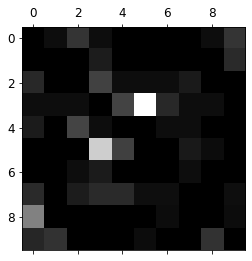

In [38]:
np.fill_diagonal(norm_conf_mx, 0)
plt.matshow(norm_conf_mx, cmap=plt.cm.gray)
#save_fig("confusion_matrix_errors_plot", tight_layout=False)
plt.show()

In [40]:
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score

print(precision_score(Y_true, Y_pred_classes, average=None))
print(25*'-')
print(precision_score(Y_true, Y_pred_classes, average="macro"))

[0.9581749  0.98742138 0.974      0.93939394 0.97142857 0.95736434
 0.98580122 0.98491379 0.98638132 0.98285714]
-------------------------
0.9727736616454875


In [41]:
print(recall_score(Y_true, Y_pred_classes, average=None))
print(25*'-')
print(recall_score(Y_true, Y_pred_classes, average="macro"))

[0.97864078 0.9894958  0.974      0.93561368 0.97942387 0.95366795
 0.99183673 0.97027601 0.97687861 0.97727273]
-------------------------
0.9727106162267558


In [42]:
print(f1_score(Y_true, Y_pred_classes, average=None))
print(25*'-')
print(f1_score(Y_true, Y_pred_classes, average="macro"))

[0.96829971 0.9884575  0.974      0.9375     0.97540984 0.95551257
 0.98880977 0.97754011 0.98160697 0.98005698]
-------------------------
0.9727193446059832


In [ ]:
from sklearn.metrics import roc_auc_score

roc_auc_score(Y_true, Y_pred_classes, average="macro", multi_class="ovo")

# Chien et chat (5 & 3)

In [43]:
analysis = pd.DataFrame({
    'Y_pred': Y_pred_classes,
    'Y_true': Y_true
})
analysis

,Y_pred,Y_true
0,7,7
1,8,8
2,4,4
3,4,4
4,6,6
...,...,...
4995,7,7
4996,9,9
4997,4,4
4998,9,9


In [44]:
error_dogs = analysis.loc[((analysis['Y_pred'] == 5) & (analysis['Y_true'] == 3))]
err_dogs = [133, 153, 339, 513, 593, 929, 1819, 1871, 1876, 2051, 2093, 2833, 2842, 3053, 3448, 4538, 4605, 4830, 4880]
error_dogs

,Y_pred,Y_true
133,5,3
153,5,3
339,5,3
513,5,3
593,5,3
929,5,3
1819,5,3
1871,5,3
1876,5,3
2051,5,3


In [45]:
error_cats = analysis.loc[((analysis['Y_pred'] == 3) & (analysis['Y_true'] == 5))]
err_cats = [401, 1295, 1506, 1764, 1931, 2099, 2141, 2273, 3007, 3190, 3267, 3473, 3607, 3794, 4654, 4769]
error_cats

,Y_pred,Y_true
401,3,5
1295,3,5
1506,3,5
1764,3,5
1931,3,5
2099,3,5
2141,3,5
2273,3,5
3007,3,5
3190,3,5


In [47]:
# Un peu à l'arrache, pas trouvé le moyen de stack les tenseurs
test = []
for X_b, y_b in test_set:
    for x in X_b:
        test.append(x.numpy())


In [48]:
test = np.array(test) 

In [ ]:
for i,t in enumerate(test):
    print(i)

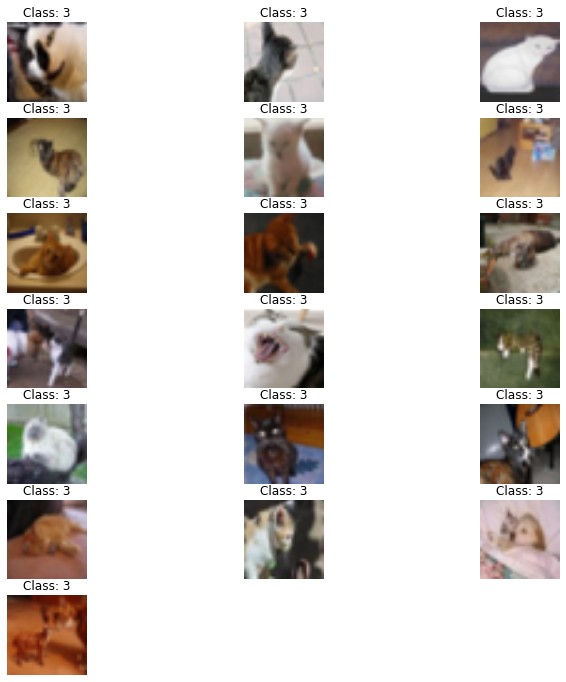

In [49]:
index = 0
plt.figure(figsize=(12, 12))
for img in err_dogs:
    plt.subplot(7, 3, index + 1)
    plt.imshow(test[img] / 2 + 0.5)
    plt.title("Class: {}".format(error_dogs.iloc[index]['Y_true']))
    plt.axis("off")
    index += 1

plt.show()

Certaines images comportent des chiens ce qui est compréhensible

In [50]:
feature_maps = model_viz_multiple_conv.predict(np.expand_dims(test[133], 0))

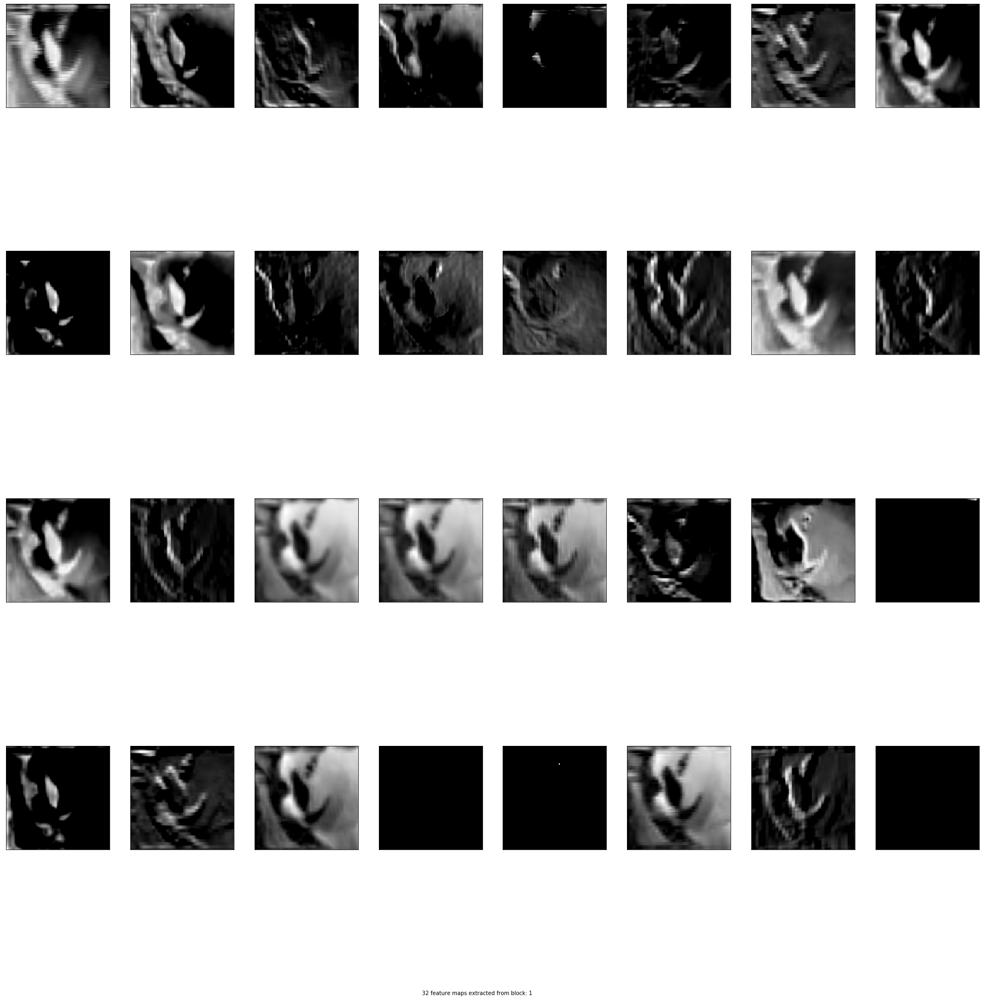

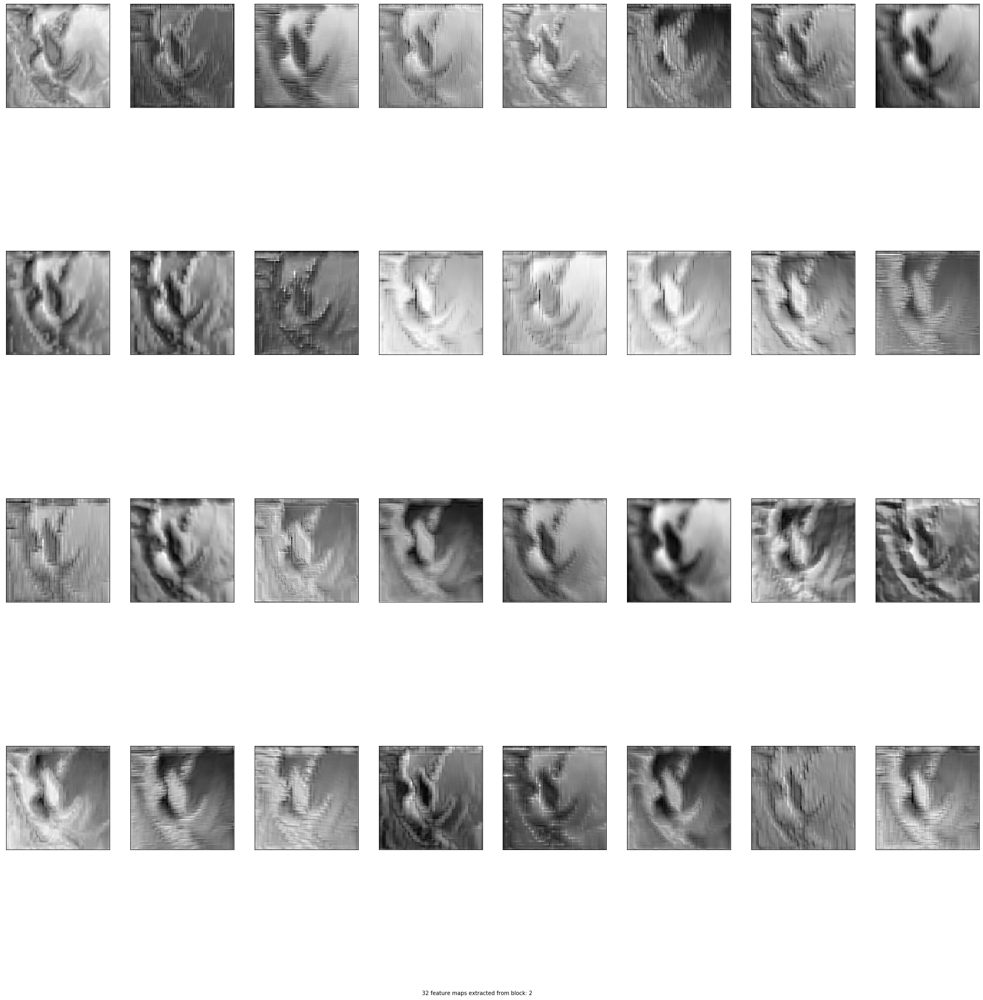

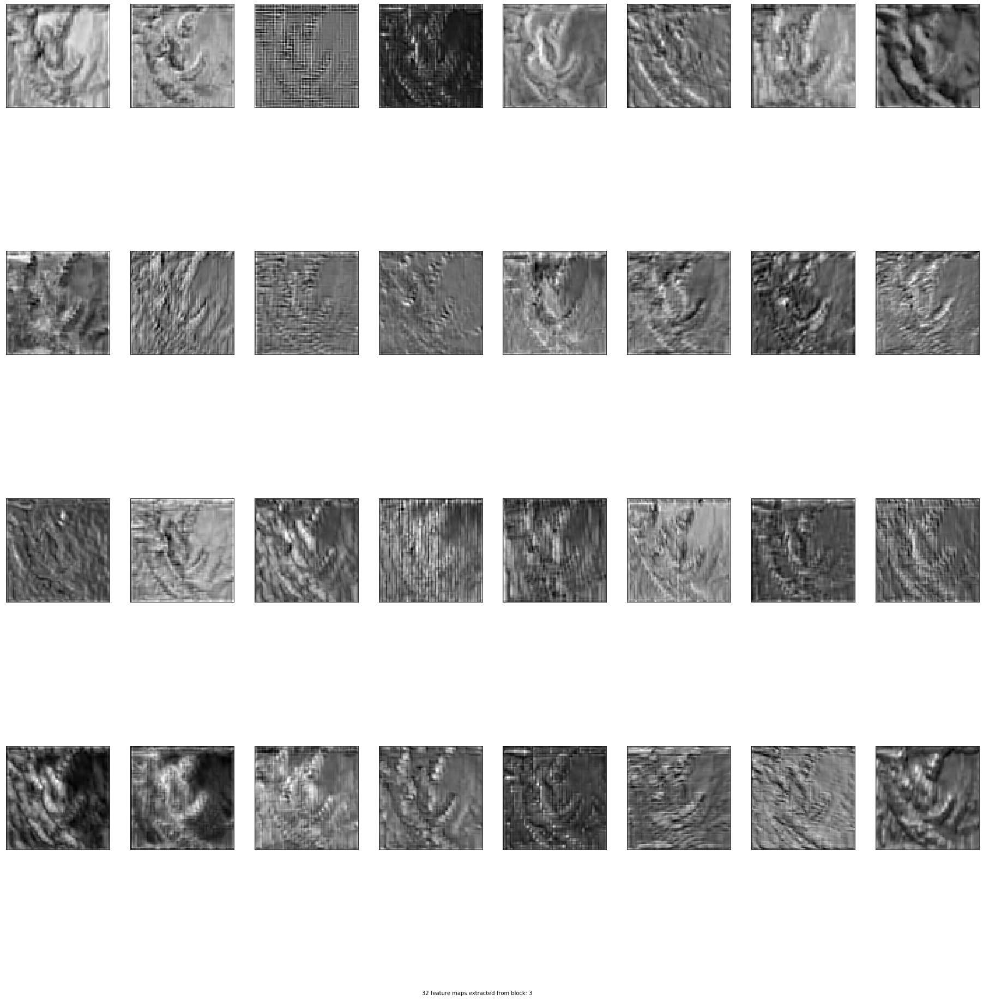

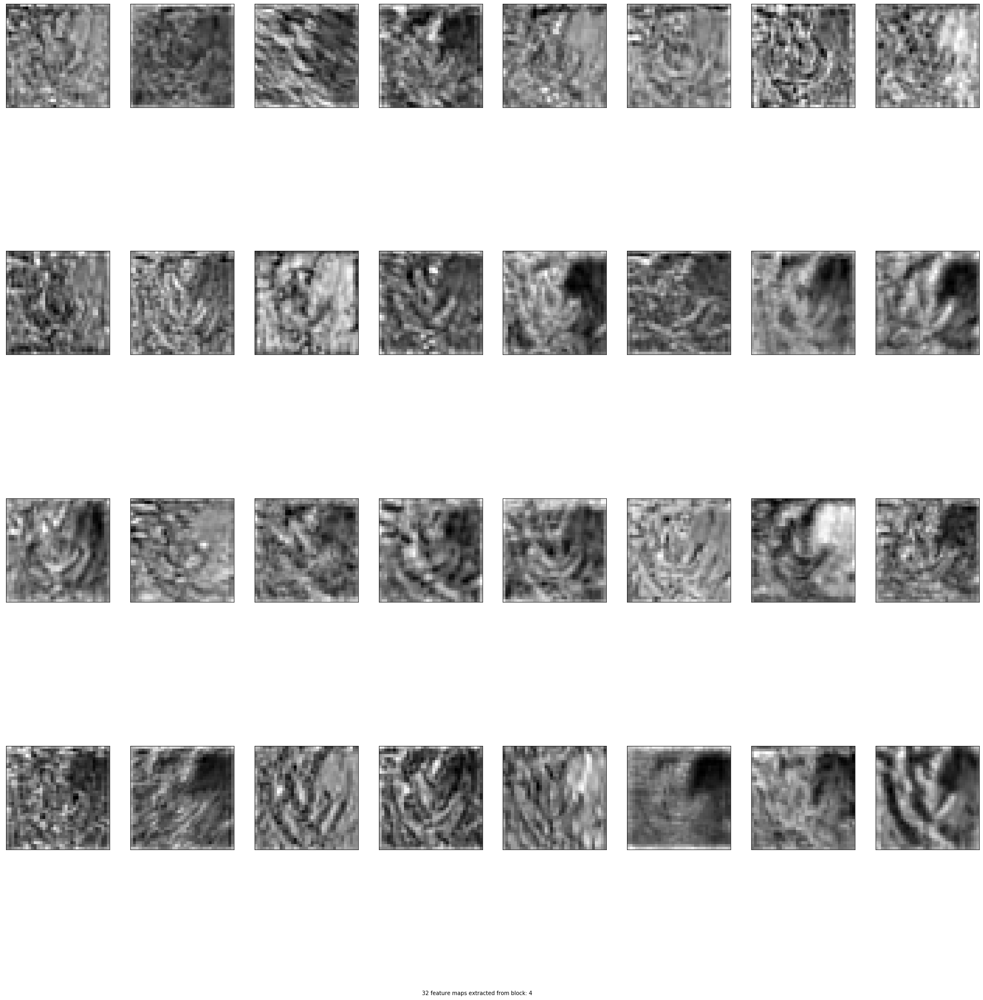

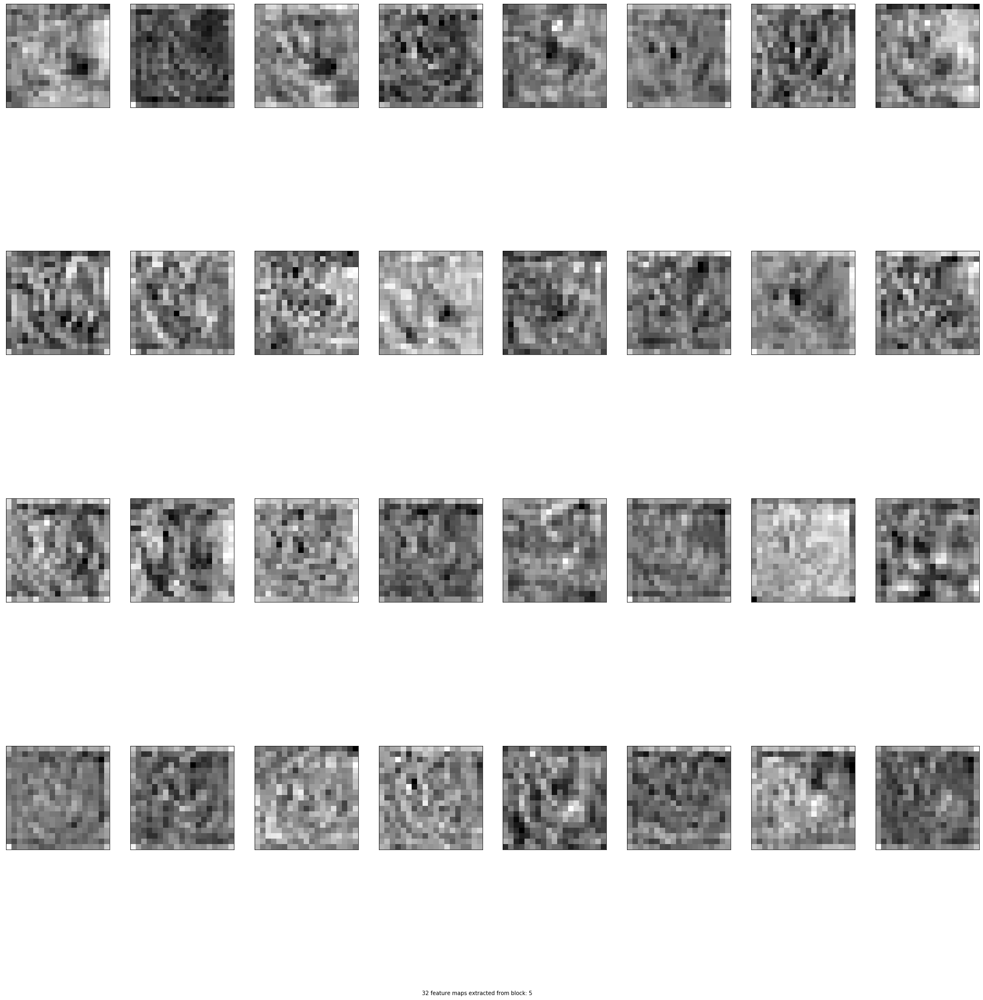

...

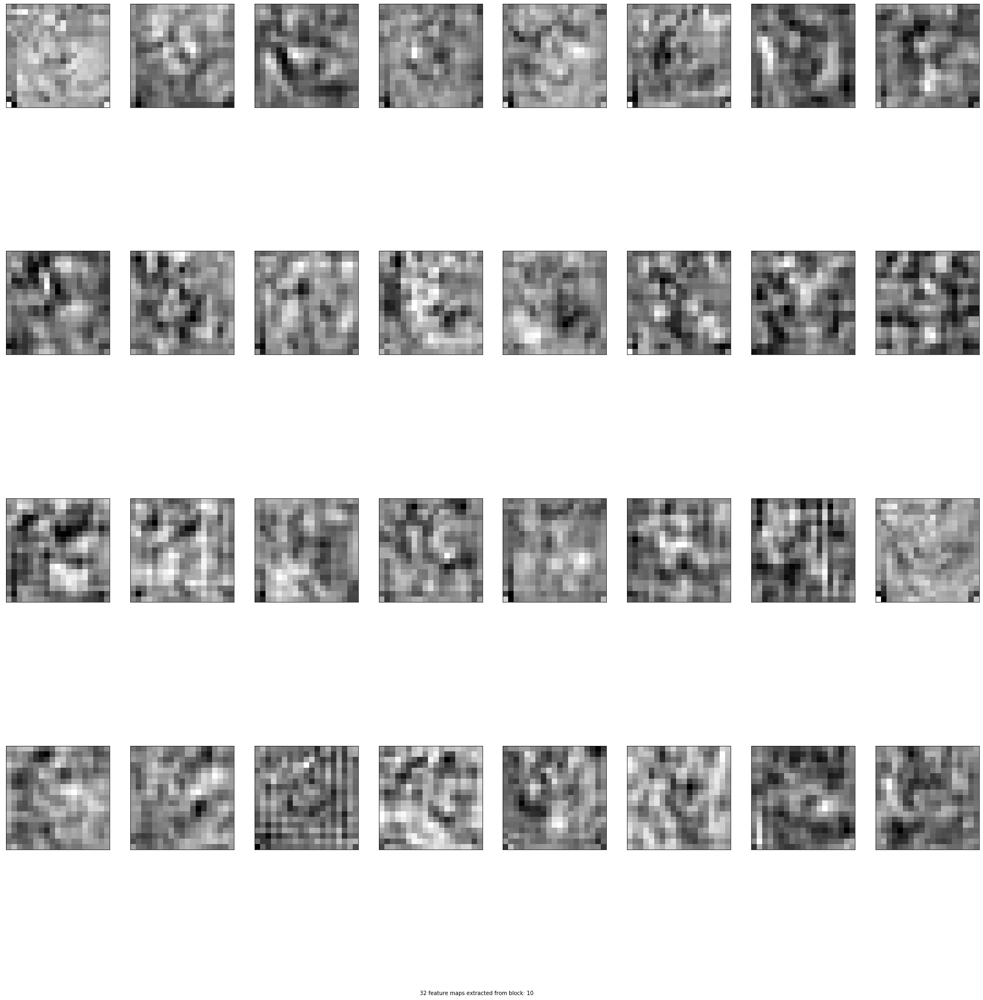

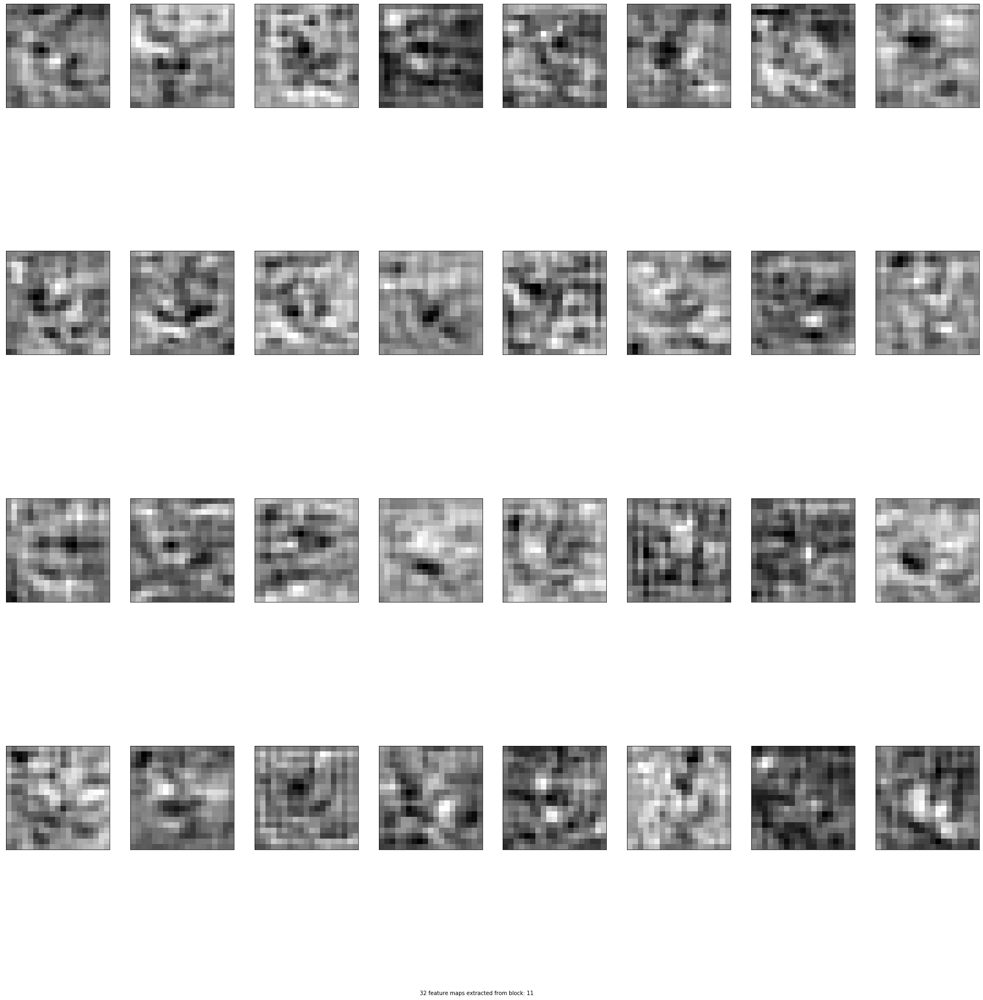

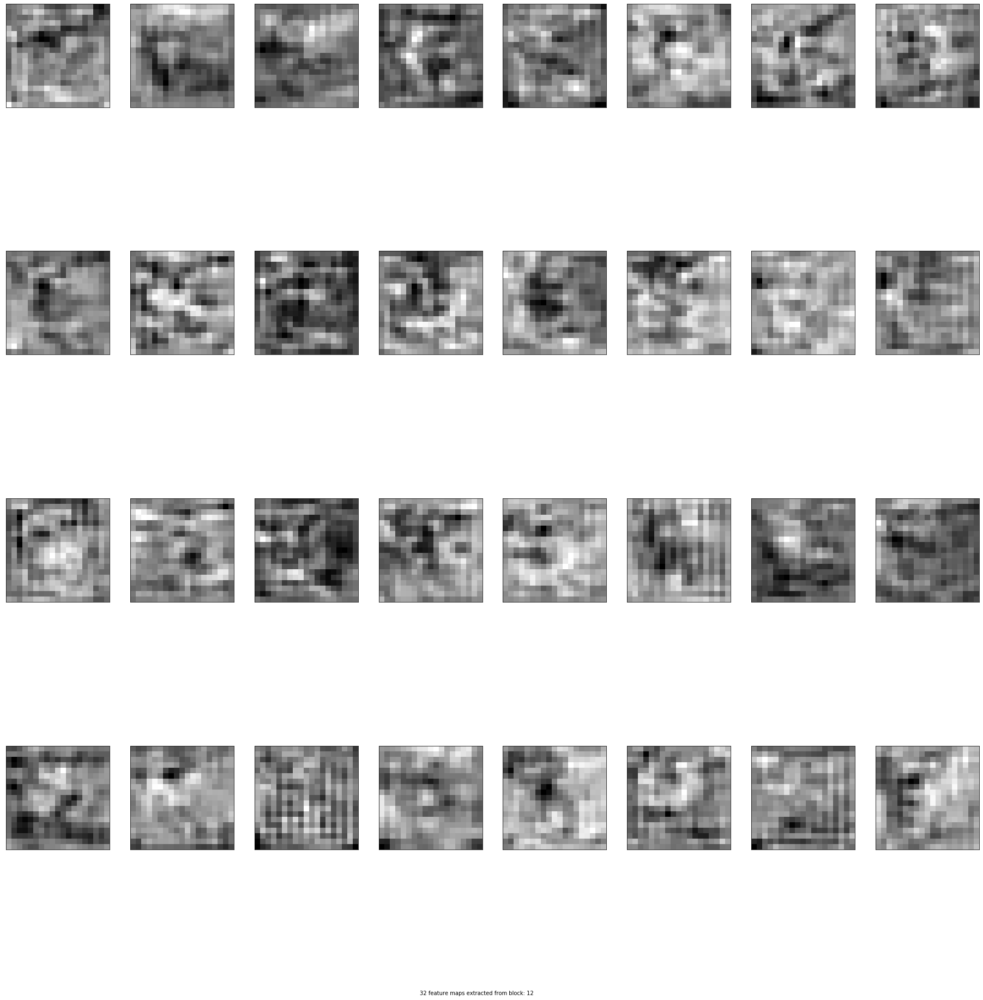

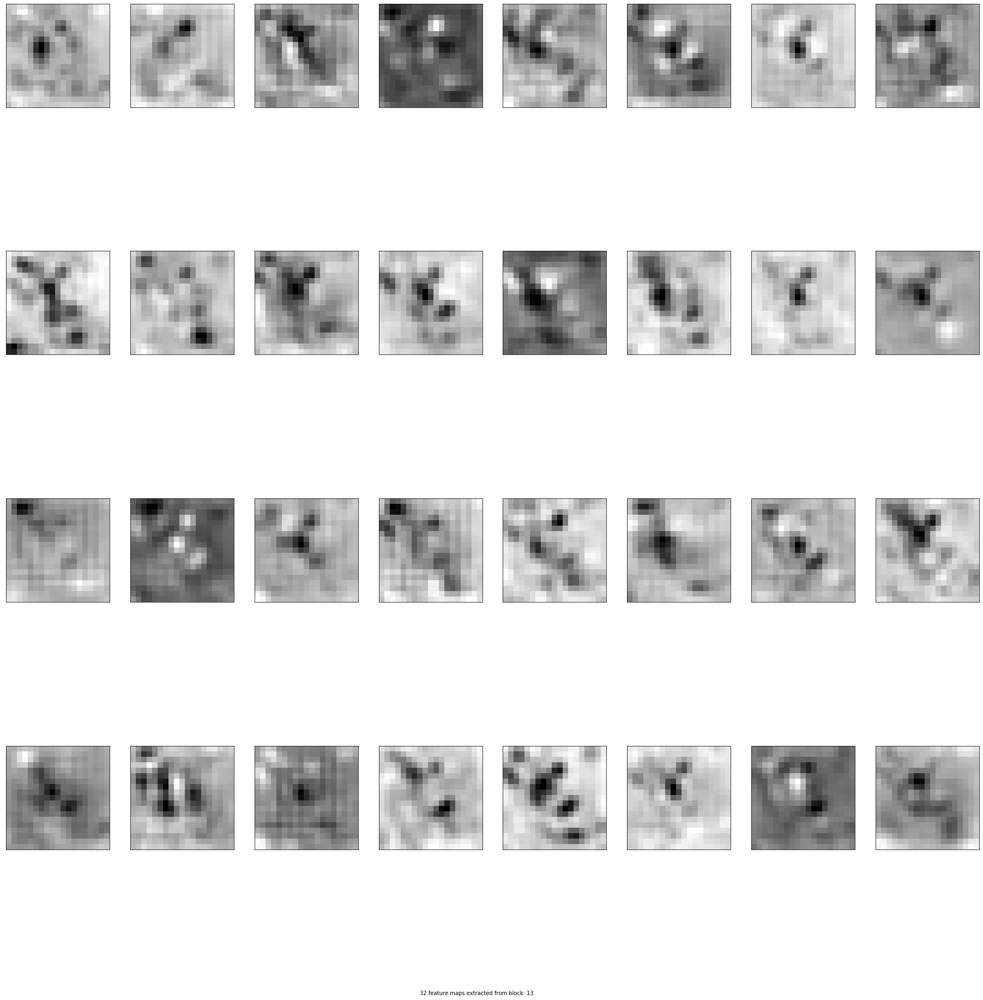

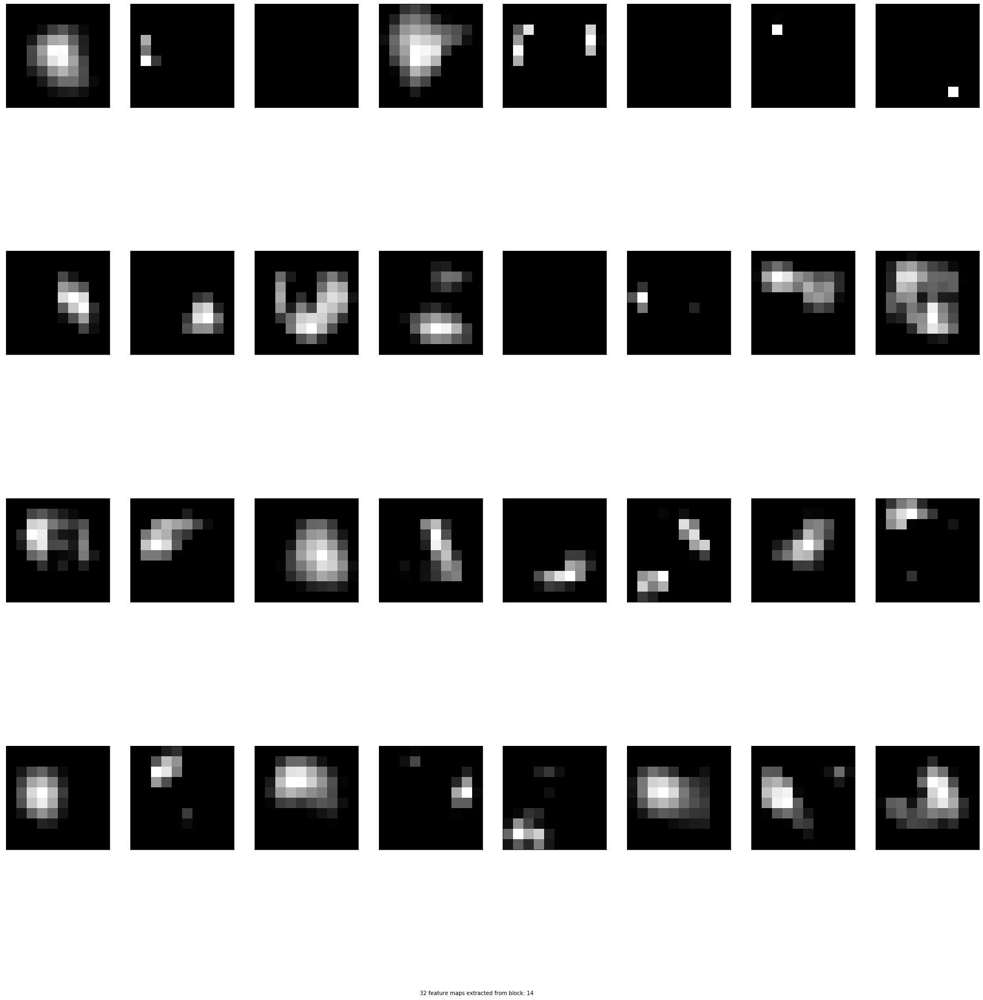

In [51]:
row = 4
col = 8
i_conv = 1
for fmap in feature_maps:
    fig = plt.figure(figsize=(32,32))
    fig.text(.5, .05, "32 feature maps extracted from block: {}".format(i_conv), ha='center')

    i_conv += 1
    ix = 1
    for _ in range(row):
        for _ in range(col):
            # specify subplot and turn of axis
            ax = plt.subplot(row, col, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    plt.show()

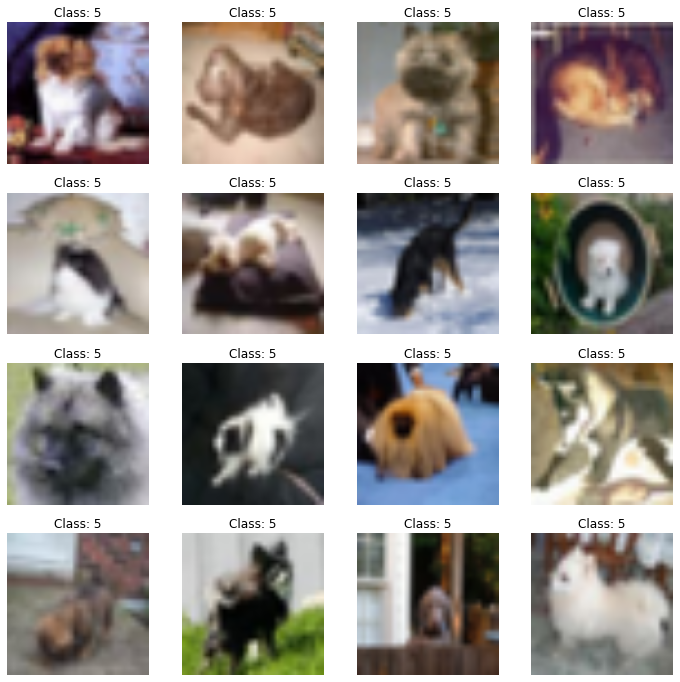

In [52]:
index = 0
plt.figure(figsize=(12, 12))
for img in err_cats:
    plt.subplot(4, 4, index + 1)
    plt.imshow(test[img] / 2 + 0.5)
    plt.title("Class: {}".format(error_cats.iloc[index]['Y_true']))
    plt.axis("off")
    index += 1

plt.show()

# Ce que recoit le modele en entrée (299*299px)

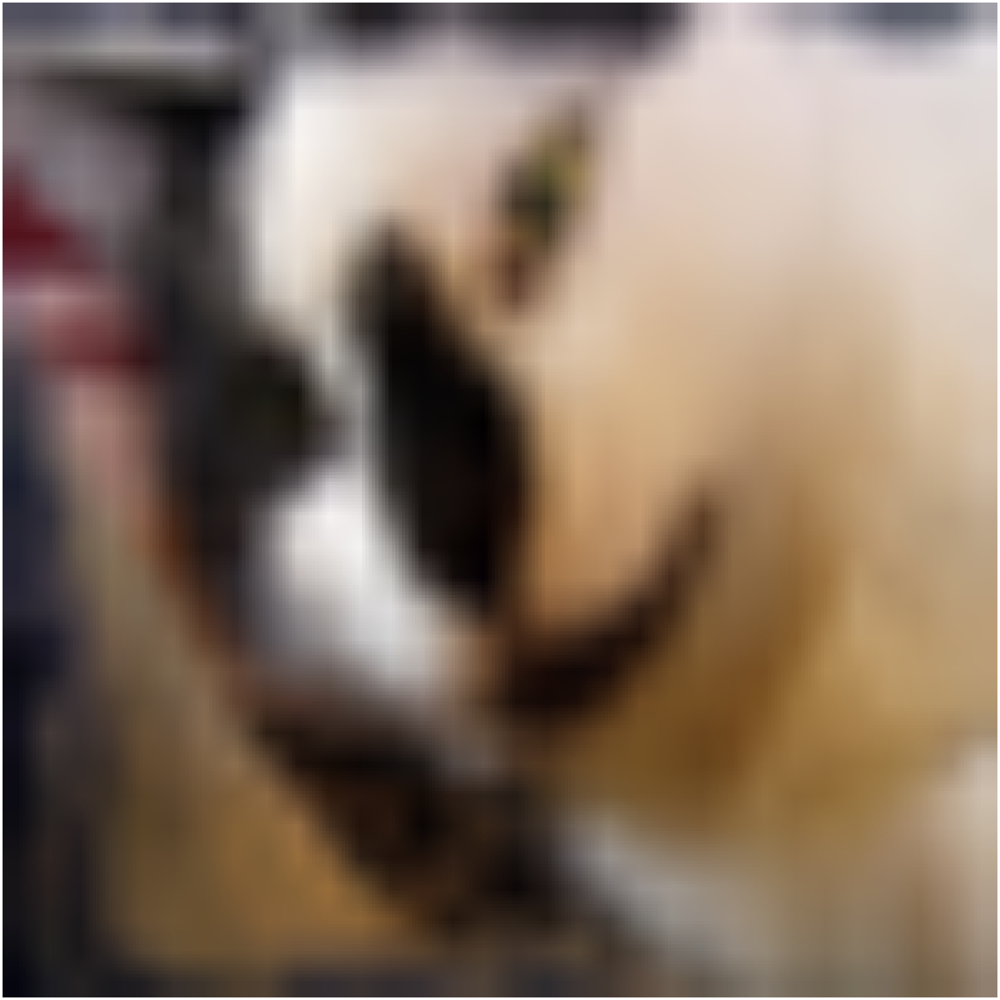

In [53]:

plt.figure(figsize=(50, 50))
plt.subplot(1, 1, 1)
plt.imshow(test[133] / 2 + 0.5)
plt.axis("off")


plt.show()

In [54]:
feature_maps = model_viz_multiple_conv.predict(np.expand_dims(test[401], 0))

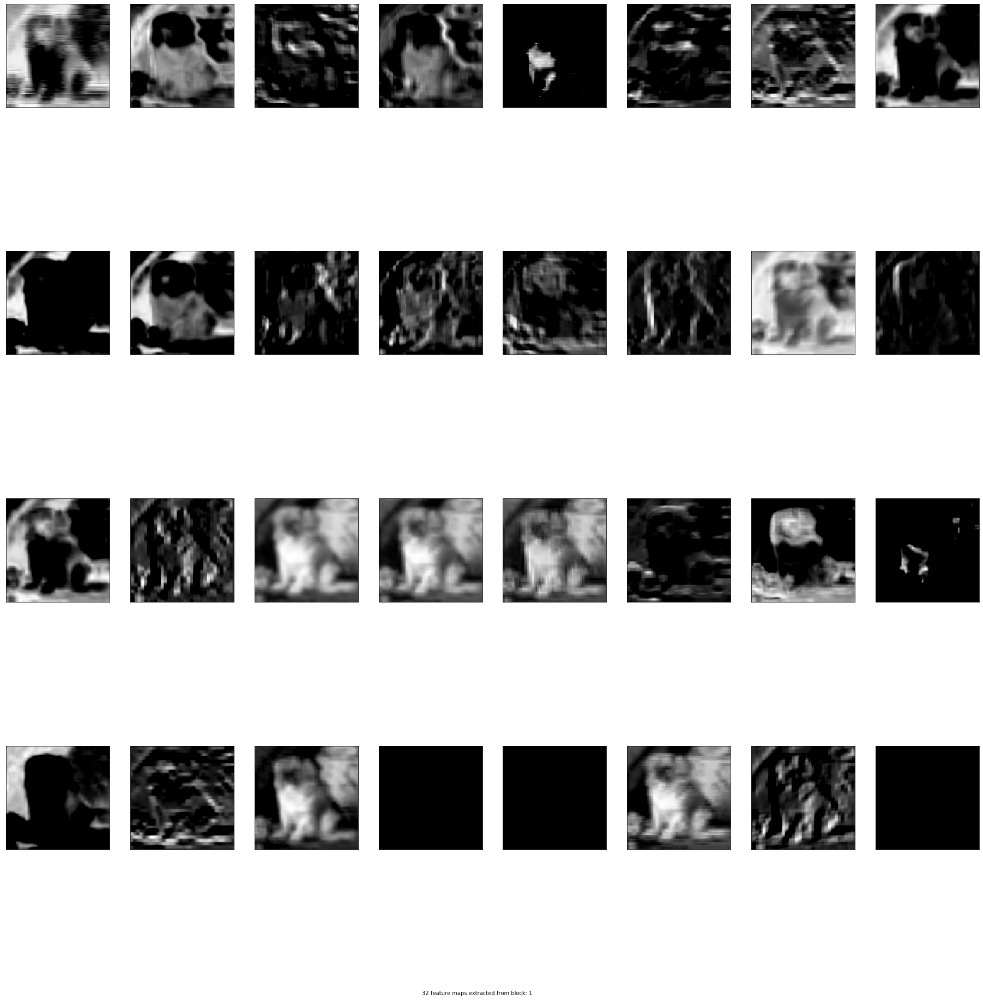

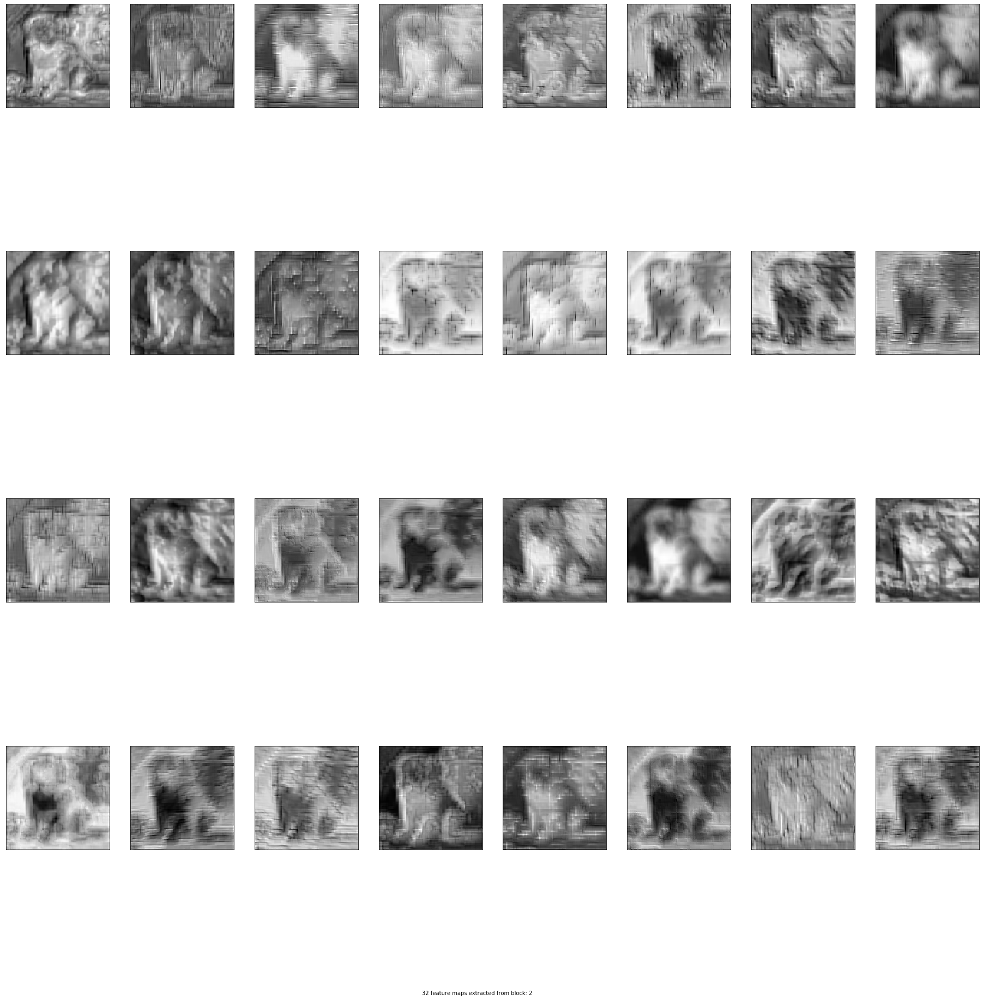

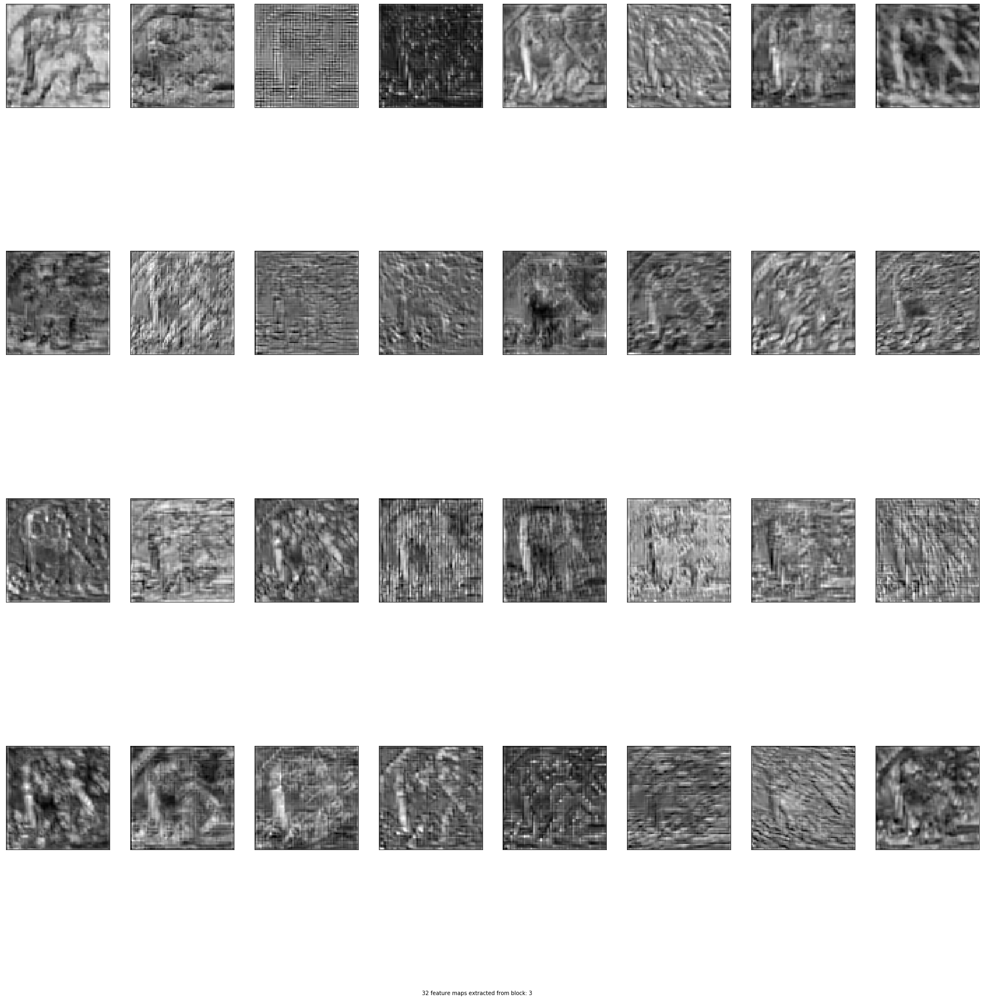

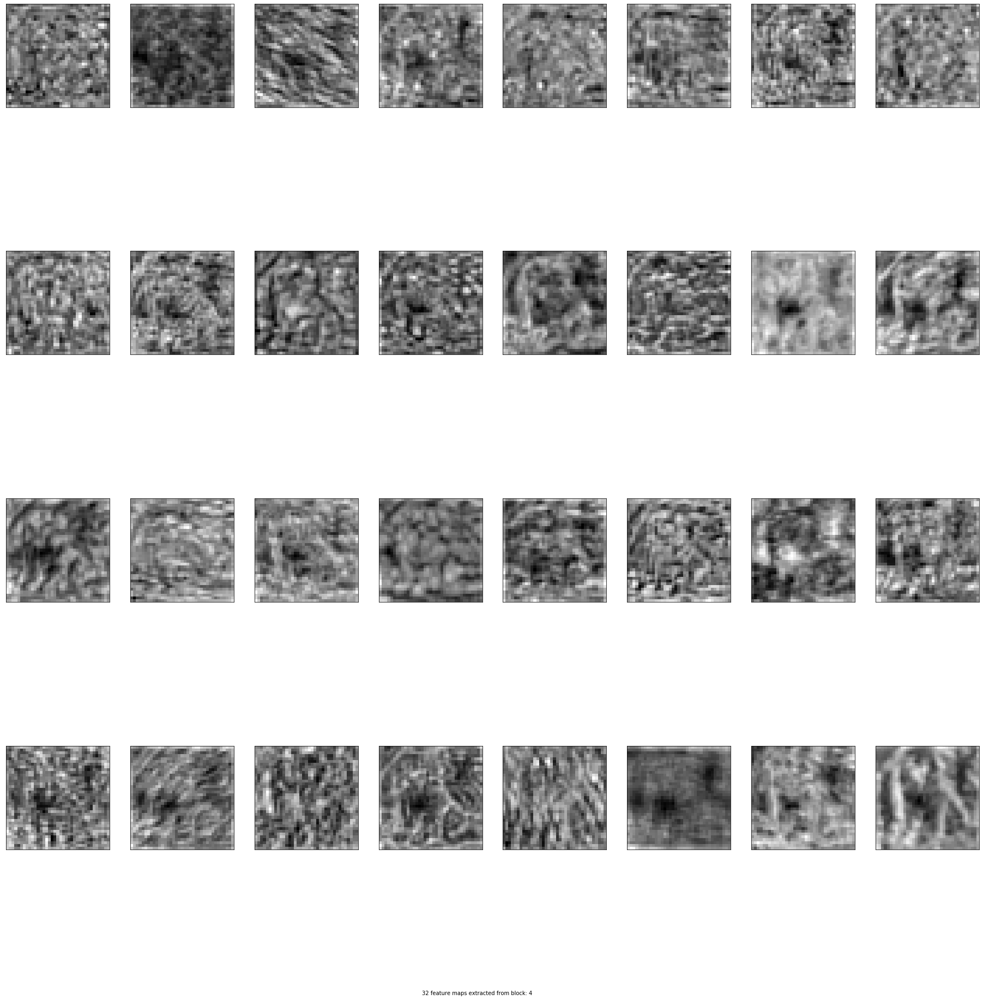

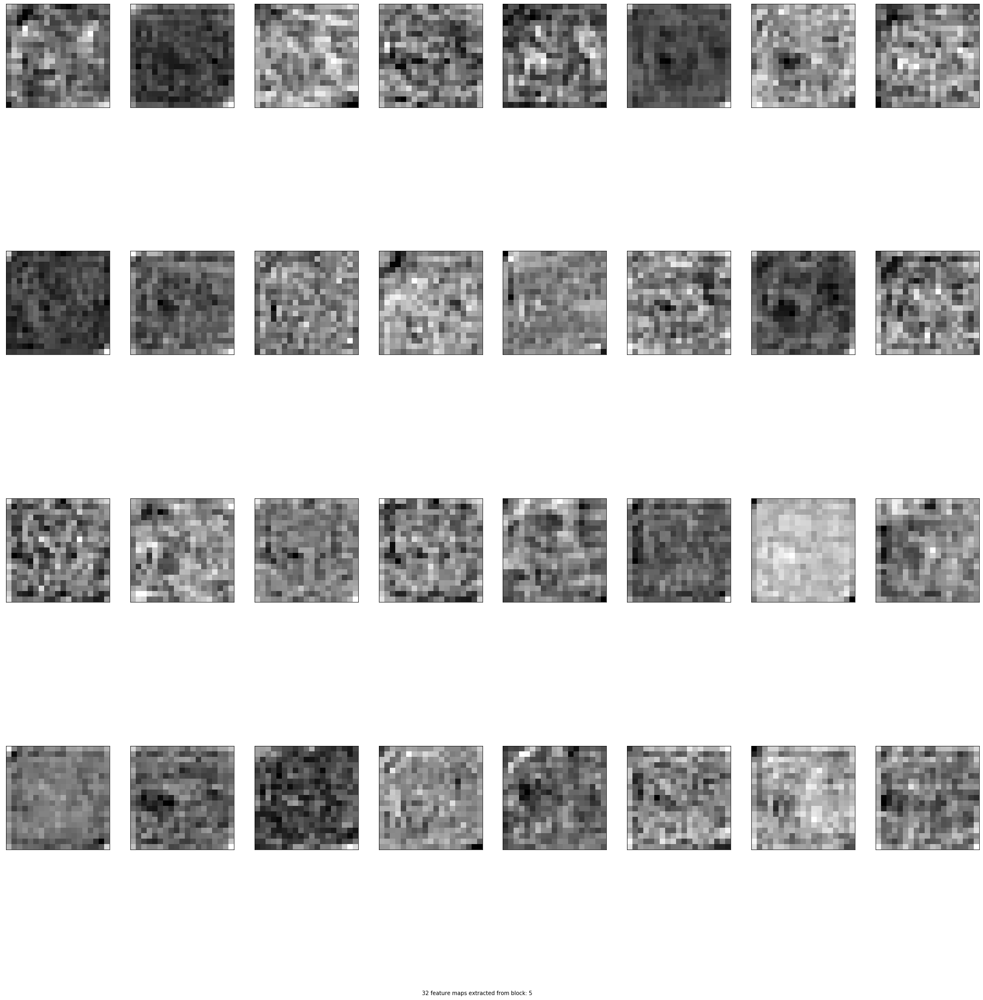

...

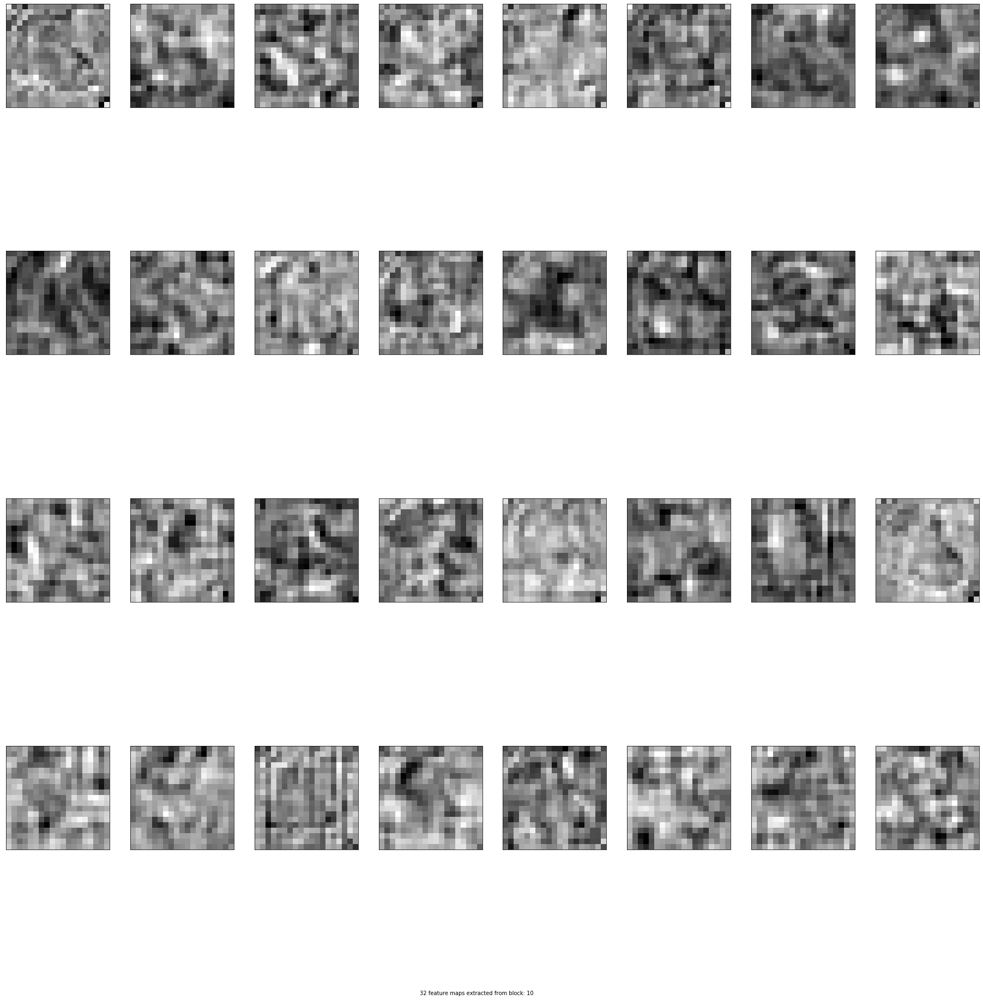

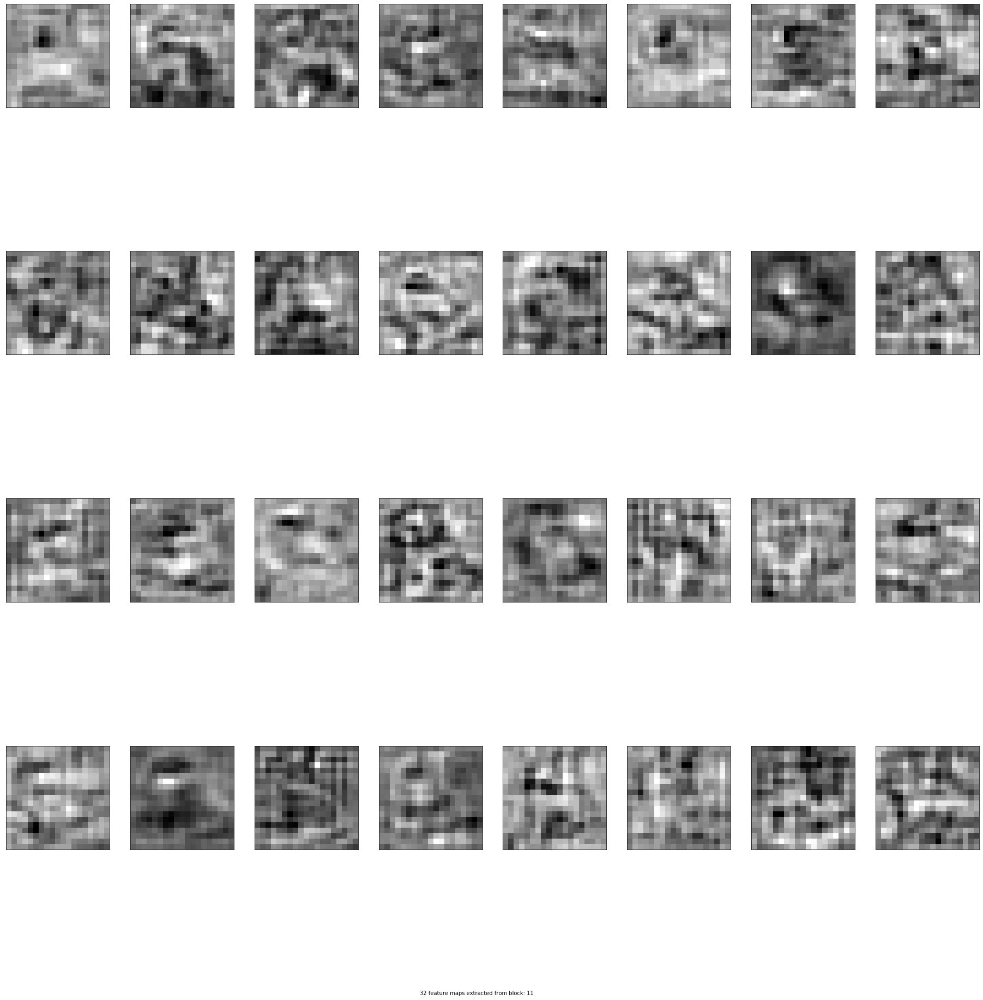

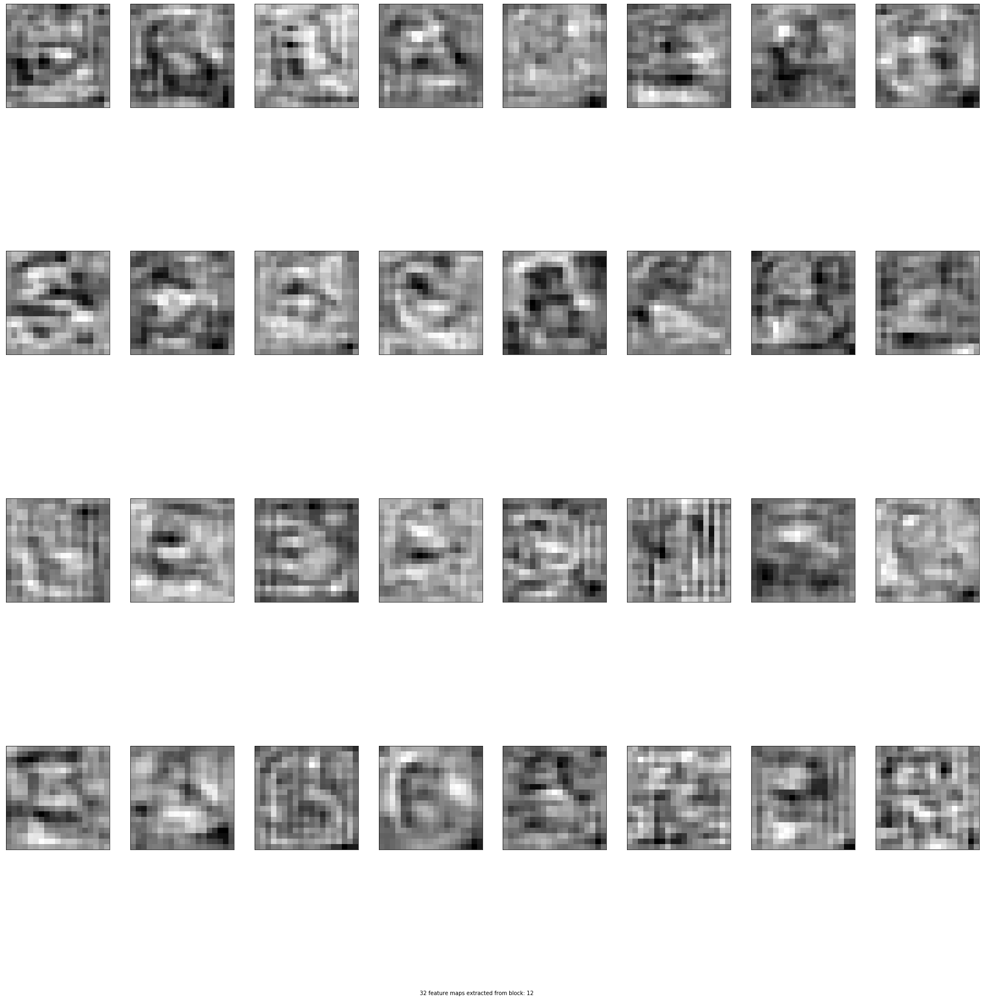

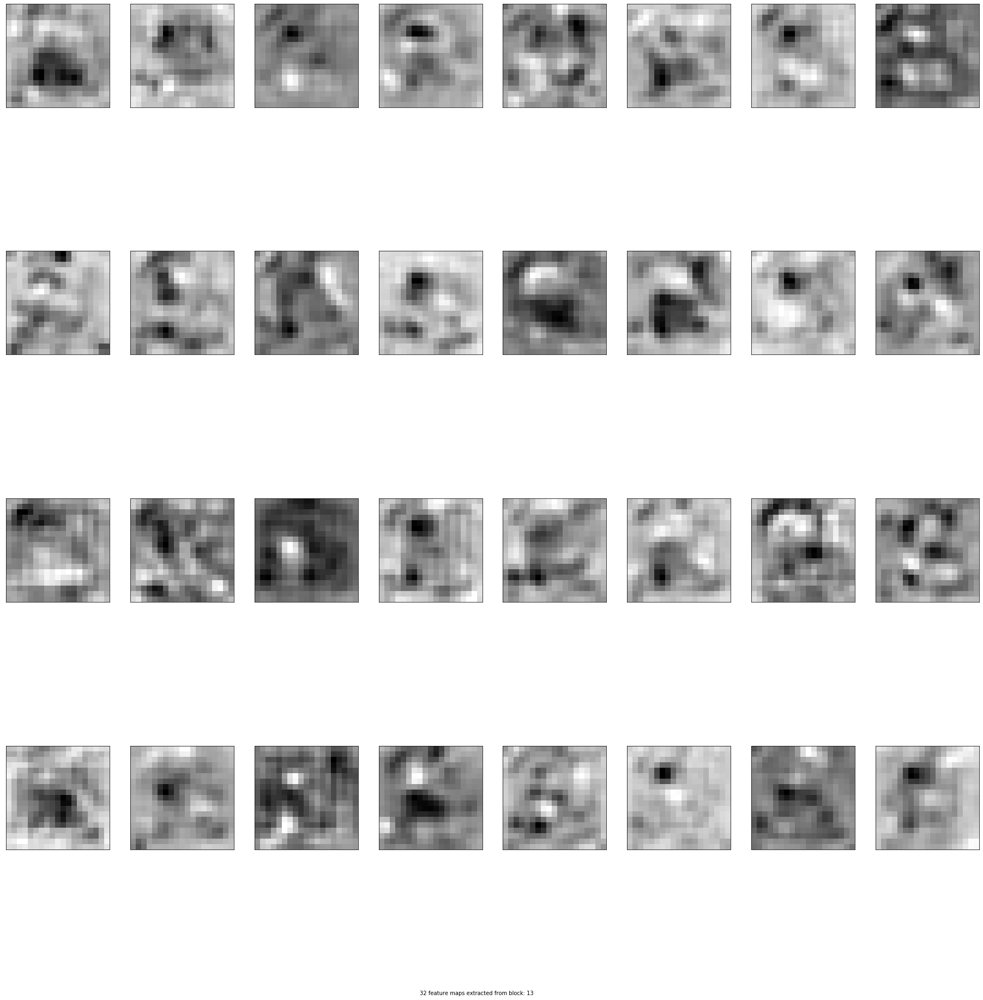

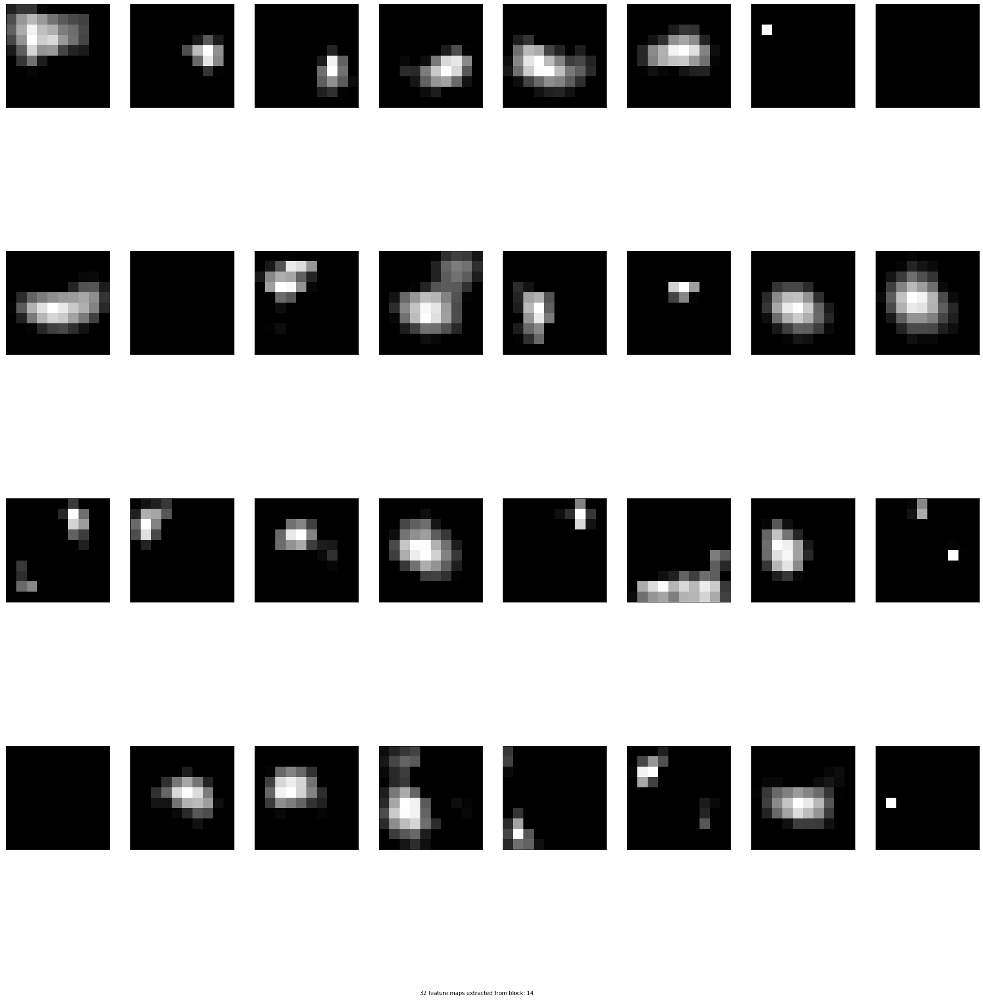

In [55]:
row = 4
col = 8
i_conv = 1
for fmap in feature_maps:
    fig = plt.figure(figsize=(32,32))
    fig.text(.5, .05, "32 feature maps extracted from block: {}".format(i_conv), ha='center')

    i_conv += 1
    ix = 1
    for _ in range(row):
        for _ in range(col):
            # specify subplot and turn of axis
            ax = plt.subplot(row, col, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    plt.show()

# Conclusion:

Le transfer learning à permis d'améliorer considérablement les performances du modèle. (0.902 % à 0.972%)
C'est un reseau beaucoup plus profond que celui utilisé from scratch. (avec des poids pré-entrainés sur 1000 classes)

Nous avons vu qu'en "unfreezant" les couches du modeles, l'accuracy s'améliore nettement.
En effet nous perdons en généralisation mais nous gagnons en spécialisation.

Concernant les erreurs du modeles, on peut proposer quelques hypotheses, malgré un tres bon score:
 - Le fait d"étirer l'image (32px à 299px) peut nuire à la classification entre deux classes proches (chien et chat)
 - Les chiens de petites tailles peuvent être pris pour des chats
 - Si plusieurs animaux sont présents sur la photo (voir err_cats) il évident que cela peut porter à confusion pour le modele.
 - Pour le modele, la frontiere est peut etre tres proche pour différencier un chat d'un chien, c'est pourquoi un chat peut etre confondu comme un chien de petite taille et donc classer comme étant un chien.
 - Concernant les bateaux et les avions, le profil long et en pointe est peut etre la cause d'erreur entre ces deux catégories. Le modele retrouve des structures propres à un avion dans certaines images de camions, ce qui le pousse à l'erreur.


Nous avons évalué les performances du modele sur d'autres mesures que l'accuracy, celles-ci donnent tout aussi un bon résultat.

## FIN CIFAR10

# Object detector with YOLOv3 on custom dataset
Voir Google Colab [Animals](https://colab.research.google.com/drive/1YXxSsCMjIH4MOEtYJwuJ0D1uHpPhOYIY#scrollTo=lQQ0xzjJv3Ja)


## Dataset Xray 

Simple essai sur X-ray avec ~91% d'acc

In [ ]:
classifier = keras.models.Sequential([
    keras.layers.Conv2D(64, 7, activation="relu", padding="same",
                    input_shape=[64, 64, 3]),
    keras.layers.MaxPooling2D(2),
    keras.layers.Conv2D(128, 3, activation="relu", padding="same"),
    keras.layers.Conv2D(128, 3, activation="relu", padding="same"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Conv2D(256, 3, activation="relu", padding="same"),
    keras.layers.Conv2D(256, 3, activation="relu", padding="same"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1, activation="sigmoid")
])

classifier.compile(optimizer="nadam", loss="binary_crossentropy", metrics=["accuracy"])

In [ ]:
from pathlib import Path
# Define path to the data directory
data_dir = Path('../input/chest-xray-pneumonia/chest_xray/chest_xray')

# Path to train directory (Fancy pathlib...no more os.path!!)
train_dir = data_dir / 'train'

# Path to validation directory
val_dir = data_dir / 'val'

# Path to test directory
test_dir = data_dir / 'test'

In [ ]:
# Entrainer le CNN sur nos images
# Image augmentation: préparation de nos images pour éviter le surapprentissage
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        validation_split=0.2)

test_datagen = ImageDataGenerator(rescale=1./255)

training_set = train_datagen.flow_from_directory(
        train_dir,
        target_size=(64, 64),
        batch_size=32,
        color_mode='rgb',
        classes=None,
        class_mode='binary',
        subset="training")

validation_set = train_datagen.flow_from_directory(
        test_datagen,
        target_size=(64, 64),
        batch_size=32,
        color_mode='rgb',
        classes=None,
        class_mode='binary',
        subset="validation")

test_set = test_datagen.flow_from_directory(
        test_dir,
        target_size=(64, 64),
        batch_size=1,
        color_mode='rgb',
        classes=None,
        shuffle=False,
        class_mode='binary')

In [ ]:
history = classifier.fit_generator(
        training_set,
        steps_per_epoch=131,
        epochs=30,
        validation_data=validation_set,
        validation_steps=33,
        verbose=1)

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

In [ ]:
STEP_SIZE_TEST=test_set.n//test_set.batch_size
classifier.evaluate_generator(generator=test_set,
steps=STEP_SIZE_TEST)

In [ ]:
STEP_SIZE_VAL=validation_set.n//validation_set.batch_size
classifier.evaluate_generator(generator=validation_set,
steps=STEP_SIZE_VAL)

# Analyse sur jeu de validation

In [ ]:
STEP_SIZE_VAL=validation_set.n//validation_set.batch_size
validation_set.reset()
pred=classifier.predict_generator(validation_set,
steps=STEP_SIZE_VAL,
verbose=1)

In [ ]:
for p in pred:
    print(p)

In [ ]:
predictions = (pred > 0.5).astype(np.int)


In [ ]:
predictions=predictions.reshape(624,)

In [ ]:
labels = (validation_set.labels)

In [ ]:
filenames=validation_set.filenames
results=pd.DataFrame({"Filename":filenames,
                      "Predictions":predictions,
                      "True": validation_set.labels
                     })

In [ ]:
results

In [ ]:
err = results.loc[results['Predictions'] != results['True']]
err